# Introduction

The problem put forwards in the assignment is to invesigate the relationship between bad weather and accidents.  The assignment is split into 2 sections, so this "report" shall also be part of a 2 notebook series.  Part 1 will be the creation of the data, part 2 will be the useage of the data.





## Methodology

In order to address the question posed in the assignment data will be needed.  Specifically data relating to weather and data relating to the number of accidents.  The next sections will cover how the data was created.

### Getting the weather data

Weather data is fortunately available for free from NOAA (National Oceanic and Atmospheric Administration) and is available on Google.  However, data seems to be present from 1929 until present (at the time 2021.)  Given that the accidents which occured almost 100 years ago would be very different to the ones today, it is a safe assumption that these will not be of any use.  In addition, while the NOAA dataset has weather from back then, does collision data exist?

Within Google, there exists a dataset called **bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions** which contains the collision data which would be useful for this assigment.  It is this dataset, in addition to the weather data, which will be used to answer the question.

#### Earliest and most recent collisions

Using the **bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions** a query is run to check what is the earliest recorded collision:
```sql
SELECT MIN(timestamp) FROM `bigquery-public-data.new_york_mv_collisions.ypd_mv_collisions`
```
Which returned a value of **2012-07-01T00:05:00**

It would then be prudent to check when the last recorded collision was.  The query for this is:
```sql
SELECT MAX(timestamp) FROM `bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions`
```
Which returned **2021-09-14T23:57:00**

Using these two dates, it will be possible to extract only the weather data which is of interest in answering the question.


### Getting the weather data

From the table **bigquery-public-data.noaa_gsod.gsod2012** a view is constucted using the earliest and latest recorded accidents.  This query is:
```sql
CREATE VIEW `uhi-assignment-1.assignment.weather_2012_to_2021` AS
SELECT DATE(CAST(year as INT64), CAST(mo as INT64), CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp, sndp, fog 
FROM `bigquery-public-data.noaa_gsod.gsod2012` WHERE stn='725060'
union all
SELECT DATE(CAST(year as INT64), CAST(mo as INT64), CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp, sndp, fog 
FROM `bigquery-public-data.noaa_gsod.gsod2013` WHERE stn='725060'
union all
SELECT DATE(CAST(year as INT64), CAST(mo as INT64), CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp, sndp, fog 
FROM `bigquery-public-data.noaa_gsod.gsod2014` WHERE stn='725060' AND wban='14756'
union all
SELECT DATE(CAST(year as INT64), CAST(mo as INT64), CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp, sndp, fog 
FROM `bigquery-public-data.noaa_gsod.gsod2015` WHERE stn='725060'
union all
SELECT DATE(CAST(year as INT64), CAST(mo as INT64), CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp, sndp, fog 
FROM `bigquery-public-data.noaa_gsod.gsod2016` WHERE stn='725060'
union all
SELECT DATE(CAST(year as INT64), CAST(mo as INT64), CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp, sndp, fog 
FROM `bigquery-public-data.noaa_gsod.gsod2017` WHERE stn='725060'
union all
SELECT DATE(CAST(year as INT64), CAST(mo as INT64), CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp, sndp, fog 
FROM `bigquery-public-data.noaa_gsod.gsod2018` WHERE stn='725060'
union all
SELECT DATE(CAST(year as INT64), CAST(mo as INT64), CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp, sndp, fog 
FROM `bigquery-public-data.noaa_gsod.gsod2019` WHERE stn='725060'
union all
SELECT DATE(CAST(year as INT64), CAST(mo as INT64), CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp, sndp, fog 
FROM `bigquery-public-data.noaa_gsod.gsod2020` WHERE stn='725060'
union all
SELECT DATE(CAST(year as INT64), CAST(mo as INT64), CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp, sndp, fog 
FROM `bigquery-public-data.noaa_gsod.gsod2021` WHERE stn='725060'
ORDER BY year, mo, da;
```

#### Data verification

It is a good idea to check the data looks correct.  The number of records were counted in the view:
```sql
SELECT COUNT(*) FROM `uhi-assignment-1.assignment.weather_2012_to_2021`
```
Returns **3549**

To ensure there is a full year of data (or as close to a full year as possible) the following query was executed (for 2012):
```sql
SELECT COUNT(*) FROM `uhi-assignment-1.assignment.weather_2012_to_2021` WHERE year = '2012'
```
Please note, the yewar was adjusted from 2012 to 2021 and the query was re-executed each time.

This resulted in the following:

Year|Query|Result
----|-----|------
2012|SELECT COUNT(*) FROM uhi-assignment-1.assignment.weather_2012_to_2021 WHERE year = '2012'|366   
2013|SELECT COUNT(*) FROM uhi-assignment-1.assignment.weather_2012_to_2021 WHERE year = '2013'|365
2014|SELECT COUNT(*) FROM uhi-assignment-1.assignment.weather_2012_to_2021 WHERE year = '2014'|365
2015|SELECT COUNT(*) FROM uhi-assignment-1.assignment.weather_2012_to_2021 WHERE year = '2015'|365
2016|SELECT COUNT(*) FROM uhi-assignment-1.assignment.weather_2012_to_2021 WHERE year = '2016'|366
2017|SELECT COUNT(*) FROM uhi-assignment-1.assignment.weather_2012_to_2021 WHERE year = '2017'|365
2018|SELECT COUNT(*) FROM uhi-assignment-1.assignment.weather_2012_to_2021 WHERE year = '2018'|365
2019|SELECT COUNT(*) FROM hi-assignment-1.assignment.weather_2012_to_2021 WHERE year = '2019'|365
2020|SELECT COUNT(*) FROM uhi-assignment-1.assignment.weather_2012_to_2021 WHERE year = '2020'|366
2021|SELECT COUNT(*) FROM uhi-assignment-1.assignment.weather_2012_to_2021 WHERE year = '2021'|261
|Total|3549

The sum total of the years matches the total we got for all years.
(2012,2016,2020 are leap years so those values are different.) 

## Collision Data

Looking at the assignment, it was decided to include some extra fields in the collision data.  It was thought that if the model is to be used to prediuct the level of emergency vehicle response then it would be of use to know what type of emergency response was needed.  For example, if there are several incidents where there are no injuries, then does paramedic resources need to be assigned?

The data for this is held originally in the **igquery-public-data.new_york_mv_collisions.nypd_mv_collisions** dataset.

Looking at the dataset, the following fields looked interesting this assignment:
Primarily:
* Borough
* number_of_cyclist_killed
* number_of_cyclist_injured
* number_of_motorist_killed
* number_of_motorist_injured
* number_of_pedestrians_killed
* number_of_pedestrians_injured
* number_of_persons_killed
* number_of_persons_injured

Firstly, a query is run to check how many uniquey boroughs there are (according to Wikipedia there are 5 boroughs.)
```sql
SELECT DISTINCT (borough) FROM `bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions`;
```
Which returned:

Row|bourgh       
---|-----
1	 |BROOKLYN     
2  |BRONX       
3	 |QUEENS       
4	 |MANHATTAN    
5	 |STATEN ISLAND
6  |null         

There appear to be some rows which have null boroughs.  These will be addressed later in this notebook.

Taking each borough (including the null boroughs) a query can be created to see how many records we have for each:
```sql
SELECT COUNT(*) FROM `bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions` WHERE borough = "BROOKLYN";
SELECT COUNT(*) FROM `bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions` WHERE borough = "BRONX";
SELECT COUNT(*) FROM `bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions` WHERE borough = "QUEENS";
SELECT COUNT(*) FROM `bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions` WHERE borough = "MANHATTAN";
SELECT COUNT(*) FROM `bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions` WHERE borough = "STATEN ISLAND";
SELECT COUNT(*) FROM `bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions` WHERE borough is null;
```
Which resulted in the following:

Row|bourgh       |Count  
---|-------------|-------
1	|BROOKLYN     |397447 
2  |BRONX        |183043 
3	|QUEENS       |338237 
4	|MANHATTAN    |291061
5	|STATEN ISLAND|53245  
6  |null         |563929 
   |             |1826962|

To verify this is correct:
```sql
SELECT COUNT(*) FROM `bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions`
```
**1826962** which is a match for the sum of the bourghs.



### Data Cleansing

Before progressing, it seemed like this was a good opportunity to begin thinking about data cleansing.  

Very roughly, the percentage of accidents in each borough can be worked out:

|Row|bourgh       |Count  |Percentage      |
|:-:|:-:          |:-:    |:-:             |
|1	|BROOKLYN     |397447 |21.7545301982198|
|2  |BRONX        |183043 |10.0189823324185|
|3	|QUEENS       |338237 |18.5136308253812|
|4	|MANHATTAN    |291061 |15.9314205768921|
|5	|STATEN ISLAND|53245  |2.91440106581308|
|6  |null         |563929 |30.8670350012753|

Working out the percentage is simply: 

$percent = \frac{count}{total} * 100$

From the table, it can be seen that Staten Island accounts for just under 3% of the collisions.  In addition, thinking about Staten Island, the types of collisions willl be different from those in, say, Manhatten.  At this point, it could be argued that we could drop Staten Island and it would make no different.  However, the table shows we have just over 30% of the data in the **null** borough.  It is possible - and _probable_ - that this 30% contains collisions for Staten Island - and for the other boroughs.  This needs to be addressed.

Running the following simple query:
```sql
SELECT * FROM `bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions` WHERE borough IS NULL
```
shows that the dataset does contain a latitude and longitude field.  However some of these are empty.
```sql
SELECT * FROM `bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions` WHERE borough IS NULL AND (latitude IS NULL OR longitude IS NULL)
```
This returns 181268 rows - this comes to to approx 9.9% of our records which have no bourgh, latitude and longitude for.

$9.92 = \frac{181268}{1826962} * 100$

Checking the flip side of this, the following was used:
```sql
SELECT * FROM `bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions` WHERE borough is null and (latitude is null or longitude is not null)
```
This returns 382661 rows.  

${382661} + {181268} = 563929$, which matches our orignal count or null bourghs.  The data is still correct.

With this in mind, there are three scenarios:
1.  The borough is set, we use that.
2.  The borough is empty, but we have latitude and longitude co-ordinates.
3.  The borough is empty, as is the latitude and longitude.

But, the question still remains, can the latitude and longitude be used?  The level of data which this represents means that it can't be discarded, there is far too much of it.  An additional consideration is that if this data is discarded in addition to the 10% of the data which has no location data then that looses 30%.  This is far too much to simply throw away.  

Fortunatley, google's public dataset also contains a New York bourghs, zone names, bourgh and geography spatial data.  This dataset is called __new_york_taxi_trips &#8594; taxi_zome_geom__

In order to test this dataset could be used, a record was selected which had a **null** bourrgh but had a longitude and latitude (for brevity not all of the coloumns are shown here): 

|borough|...|latitude |longitude|location              |
|:-:    |:-:|:-:      |:-:      |:-:                   |
|null   |...|40.680088|-73.94398|(40.680088, -73.94398)|

Using these values with the spatial data set could provide a way to identiy some data.  The following query was executed.
```sql
SELECT * FROM `bigquery-public-data.new_york_taxi_trips.taxi_zone_geom` tz_loc
WHERE (ST_DWithin(tz_loc.zone_geom, ST_GeogPoint(-73.94398, 40.680088),0))
```
This retuns zone_id, zone_name, bourgh and a polygon for the zone_geom - but only the borough is of interest which in this case is "**Brooklyn**" So the query above can be refactored to :
```sql
SELECT UPPER(borough) FROM `bigquery-public-data.new_york_taxi_trips.taxi_zone_geom` tz_loc
WHERE (ST_DWithin(tz_loc.zone_geom, ST_GeogPoint(-73.94398, 40.680088),0))
```
The UPPER() function to extract the bourgh name to be the same as the ones which are stored in the collisions data.  In this case, the above query yields "BROOKLYN"  

But is this correct.  Again, using Google Maps, the latitude and longitude were entered into the search box and the result (as shown) is firmly in the Brooklyn borough.

![](https://drive.google.com/uc?export=view&id=1l52LN9osS4VVB52yBtp2eRna9vSIXEpo)



## Initial Collisions view

The original intention was to create the view with a single large query.  The query would run a sub query when a record was found which had no borough, but did have a latitude and longitude.  However, due to SQL contrainst the author was not able to overcome, this approach had to be rethought out.

What was decided up was to create a basic view which would then be refined later.

This first view was created using the following query:
```sql
CREATE VIEW `uhi-assignment-1.assignment.collisions_data_bourgh_draft` AS
  SELECT
  CAST(timestamp AS DATE) AS collision_date,
  COUNT(CAST(timestamp AS DATE)) AS NUM_COLLISIONS,
  CASE
    WHEN ds.borough IS NOT NULL THEN CAST(borough AS STRING) -- when the borough is set
    WHEN ((ds.latitude IS NOT NULL or ds.longitude IS NOT NULL) AND ds.borough IS NULL) THEN "BB"
    WHEN (ds.latitude IS NULL OR ds.longitude IS NULL OR ds.borough IS NULL) THEN "Unknown"
END
  AS NEIGHBORHOOD,
  CAST(ds.latitude AS FLOAT64) AS LAT,
  CAST(ds.longitude AS FLOAT64)  AS LONG,
  SUM(CAST(number_of_cyclist_killed AS INT64)) AS CYCLISTS_KILLED,
  SUM(CAST(number_of_cyclist_injured AS INT64)) AS CYCLISTS_INJURED,
  SUM(CAST(number_of_motorist_killed AS INT64)) AS MOTORISTS_KILLED,
  SUM(CAST(number_of_motorist_injured AS INT64)) AS MOTORISTS_INJURED,
  SUM(CAST(number_of_pedestrians_killed AS INT64)) AS PEDS_KILLED,
  SUM(CAST(number_of_pedestrians_injured AS INT64)) AS PEDS_INJURED,
  SUM(CAST(number_of_persons_killed AS INT64)) AS PERSONS_KILLED,
  SUM(CAST(number_of_persons_injured AS INT64)) AS PERSONS_INJURED,
FROM
  bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions ds 
GROUP BY
  collision_date,
  NEIGHBORHOOD,
  LAT, 
  LONG
```

As can be seen in the code above, the query has a case statment.  This case statment is used to differentiate between the three scenarios identified.

* For scenario 1 (where the borough is known) - that value ussed.
* For scenario 2 (where we have no borough, but do have a location - which is made up of latitude and longitude - insert some placeholder text.
* For scenario 3 (where we have no locator information) - insert "Unknown"


### Initial View Data Validation

```sql
select * from `bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions` where date(timestamp) = '2021-04-16'
```
This was saved this off as a local CSV file and brought this into excel (see file 'data_check_1') I then did a sum on the columns for pedestrian, motorists, etc on killed and injured.  This gave the following:

|Num Records|number_of_cyclist_injured|number_of_cyclist_killed|number_of_motorist_injured|number_of_motorist_killed|number_of_pedestrians_injured|number_of_pedestrians_killed|number_of_persons_injured|number_of_persons_killed|
|:--:       | :--:                    | :--:                   | :--:                     | :--:                    | :--:                        | :--:                       | :--:                    | :--:                   |
|298        |11                	      |0                       |99                        |0                        |16                           |0                           |127                      |0                       |

The following query was then executed which would extract all columns from the newly created view for the same date:

```sql
SELECT 
 SUM(CYCLISTS_INJURED) AS CYCLISTS_INJURED,
 SUM(CYCLISTS_KILLED)  AS CYCLISTS_KILLED,
 SUM(MOTORISTS_INJURED)  AS MOTORISTS_INJURED,
 SUM(MOTORISTS_KILLED)  AS MOTORISTS_KILLED,
 SUM(PEDS_INJURED)  AS PEDS_INJURED,
 SUM(PEDS_KILLED)  AS PEDS_KILLED,
 SUM(PERSONS_INJURED)  AS PERSONS_INJURED,
 SUM(PERSONS_KILLED)  AS PERSONS_KILLED,
FROM `uhi-assignment-1.assignment.collisions_data_bourgh_draft` 
WHERE collision_date = '2021-04-16'
```

|Row|collision_date|NUM_COLLISIONS|CYCLISTS_KILLED|CYCLISTS_INJURED|MOTORISTS_KILLED|MOTORISTS_INJURED|PEDS_KILLED|PEDS_INJURED|PERSONS_KILLED|PERSONS_INJURED|
|:-:|:-:           |:-:           |:-:            |:-:             |:-:             |:-:              | :-:       | :-:        | :-:          | :-:           |
|1  |2021-04-16    |277           |0              |11              |0               |101              |0          |16          |0             |129            |

The values match - the number of records are different.  But that aside, we are looking good.  Our "draft" view is holding up.



## Adding in a day field

Using the initial "draft" view as a basis, the following query was run:

```sql
CREATE VIEW `uhi-assignment-1.assignment.collisions_data_final` 
AS SELECT FORMAT_DATE("%u", collision_date) as day, collision_date, NEIGHBORHOOD, LAT, LONG, NUM_COLLISIONS, CYCLISTS_KILLED, CYCLISTS_INJURED, MOTORISTS_KILLED, MOTORISTS_INJURED, PEDS_KILLED, PEDS_INJURED, PERSONS_KILLED, PERSONS_INJURED
FROM `uhi-assignment-1.assignment.collisions_data_bourgh_draft`;
```

```sql
SELECT * FROM `uhi-assignment-1.assignment.collisions_data_final`  where collision_date = '2019-12-04'
```
Which shows that the 4th December, 2019 is a Wednesday (value 3)



## Final Table

The following was run:

```sql
CREATE TABLE `uhi-assignment-1.assignment.collated_data` 
AS SELECT day, year, mo, da, collision_date,  NEIGHBORHOOD, LAT, LONG,temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp, sndp, fog, CYCLISTS_KILLED, CYCLISTS_INJURED, MOTORISTS_KILLED, MOTORISTS_INJURED, PEDS_KILLED, PEDS_INJURED,PERSONS_KILLED, PERSONS_INJURED, NUM_COLLISIONS FROM `uhi-assignment-1.assignment.weather_2012_to_2021` as weather,
`uhi-assignment-1.assignment.collisions_data_final` as complaints WHERE complaints.collision_date = weather.date
```

This creates a new table based off the view.  However, some additional work is needed.  There are still the bourghs marked as "BB" (scenario 2) and the boroughs marked "Unknown".  Due to the aforementioned SQL block, it was decided to extract this data and finish manipulating it outside of BigQuery.  

The following query was ran:

```sql
SELECT * FROM `uhi-assignment-1.assignment.collisions_data_final`  
```

and the result exported as a CSV - the file was over 150MB so was only able to be saved to Google drive and then downloaded locally.



## Finishing the raw data

The intention was to create a CSV file which had a row for  each day and for each day was broken to borough and then this would show the counts for collisions and for injuries (so there would be 5 rows per day - one for each borough.

A python script was created to parse the file to make use of pythons dictionaries, tuples and lists to do this.  The script is in the next text block:


```python
import csv
import sys
import os
from google.cloud import bigquery

# constants
SERVICE_KEY_jSON = './service_key.json'
FILENAME_IN = 'bq-results-2017-jan.csv'
FILENAME_OUT = 'Final_data_2017-jan.csv'

# set OS environment
os.environ["GOOGLE_APPLICATION_CREDENTIALS"] = SERVICE_KEY_jSON


def getBoroghFromLatLong(lat, long):
    print('Entered Borough Query')
    returnVal = ""
    client = bigquery.Client()         # Start the BigQuery Client
    QUERY = (
        'SELECT UPPER(borough) AS BOROUGH FROM `bigquery-public-data.new_york_taxi_trips.taxi_zone_geom` tz_loc WHERE (ST_DWithin(tz_loc.zone_geom, ST_GeogPoint(' + str(long) + ', ' + str(lat) + '),0))')

    query_job = client.query(QUERY)    # Start Query API Request
    query_result = query_job.result()  # Get Query Result
    df = query_result.to_dataframe()

    try:
        returnVal = str(df["BOROUGH"].values[0])
    except IndexError:
        returnVal = "Unknown"

    return returnVal


def open_file(file_in, skip_header=True):
    print(f'Opening file {file_in}')
    # setup a variable to hold the data from the file
    data = ''
    try:
        with open(file_in, encoding='utf-8-sig', mode='r') as file:
            reader = csv.reader(file)
            if skip_header is True:
                # if skip_header is true, then skip to the next line
                next(reader, None)
            # make each row in the input file into a tuple and add
            # this to a list to be returned.
            data = [tuple(row) for row in reader]
    # handle file not found errors with a nice error message
    except FileNotFoundError:
        print('File {} does not exist.'.format(file_in))
        sys.exit(1)
    except:  # generic catch all error message
        print(
            'Trying to open {} failed.  No further information was available'
            .format(file_in))
        sys.exit(1)
    # return the data variable (the file contents)
    return data


def create_report(file_name, headers, content):
    try:
        with open(file_name, 'a', newline="") as out_file:
            csvwriter = csv.writer(out_file)
            csvwriter.writerow(headers)
            csvwriter.writerows(content)
    except:
        print(
            'Trying to create {} failed.  No further information was available'
            .format(file_name)
        )
        sys.exit(1)


def collate_data(data_in):
    x = 1
    unknown_rows = 0
    found_rows = 0
    linesInFile = len(data_in)

    print(f'Processing {linesInFile} lines')

    output_dict = {}

    for row in data_in:
        # make a little progress counter -
        # otherwise we have no clue what's happening
        pcent = round((x / linesInFile * 100), 2)
        print(f'Processing row - {x} - {pcent}%')

        # make things easier to reference
        day = row[0]
        year = row[1]
        mo = row[2]
        da = row[3]
        collision_date = row[4]
        neighborhood = row[5]
        lat = row[6]
        long = row[7]
        temp = row[8]
        dewp = row[9]
        slp = row[10]
        visib = row[11]
        wdsp = row[12]
        mxpsd = row[13]
        gust = row[14]
        max = row[15]
        min = row[16]
        prcp = row[17]
        sndp = row[18]
        fog = row[19]

        # someone forgot to fill in numbers, so we
        # need to check something is here as there
        # are nulls in the data
        if row[20] == "":
            cyclists_killed = 0
        else:
            cyclists_killed = int(row[20])

        if row[21] == "":
            cyclists_injured = int(row[21])
        else:
            cyclists_injured = int(row[21])

        if row[22] == "":
            motorists_killed = 0
        else:
            motorists_killed = int(row[22])

        if row[23] == "":
            motorists_injured = 0
        else:
            motorists_injured = int(row[23])

        if row[24] == "":
            peds_killed = 0
        else:
            peds_killed = int(row[24])

        if row[25] == "":
            peds_injured = 0
        else:
            peds_injured = int(row[25])

        if row[26] == "":
            persons_killed = 0
        else:
            persons_killed = int(row[26])

        if row[27] == "":
            persons_injured = 0
        else:
            persons_injured = int(row[27])

        if row[28] == "":
            num_collisions = 0
        else:
            num_collisions = int(row[28])

        if collision_date not in output_dict:
            output_dict[collision_date] = {}

        # deal with the horrid "BB" - these are entries which have no latitude, longitude or borough.
        if neighborhood == "BB":
            neighborhood = getBoroghFromLatLong(lat, long)
            print(
                f'     --> Handling missing borogh - from {lat} and {long} got {neighborhood}')
            found_rows += 1
        else:
            neighborhood = neighborhood

        # we have bad data we cannot do anything with, I've marked this as
        # neighbourhood "Unknown" - skip over this
        if neighborhood == "Unknown":
            print('     Skipping row - unusable data')
            unknown_rows += 1
            continue

        if neighborhood not in output_dict[collision_date]:
            output_dict[collision_date][neighborhood] = {}
            output_dict[collision_date][neighborhood]["day"] = ""
            output_dict[collision_date][neighborhood]["year"] = ""
            output_dict[collision_date][neighborhood]["mo"] = ""
            output_dict[collision_date][neighborhood]["da"] = ""

            output_dict[collision_date][neighborhood]["temp"] = 0
            output_dict[collision_date][neighborhood]["dewp"] = 0
            output_dict[collision_date][neighborhood]["slp"] = 0
            output_dict[collision_date][neighborhood]["visib"] = 0
            output_dict[collision_date][neighborhood]["wdsp"] = 0
            output_dict[collision_date][neighborhood]["mxpsd"] = 0
            output_dict[collision_date][neighborhood]["gust"] = 0
            output_dict[collision_date][neighborhood]["max"] = 0
            output_dict[collision_date][neighborhood]["min"] = 0
            output_dict[collision_date][neighborhood]["prcp"] = 0
            output_dict[collision_date][neighborhood]["sndp"] = 0
            output_dict[collision_date][neighborhood]["fog"] = 0

            output_dict[collision_date][neighborhood]["cyclists_killed"] = 0
            output_dict[collision_date][neighborhood]["cyclists_injured"] = 0
            output_dict[collision_date][neighborhood]["motorists_killed"] = 0
            output_dict[collision_date][neighborhood]["motorists_injured"] = 0
            output_dict[collision_date][neighborhood]["peds_killed"] = 0
            output_dict[collision_date][neighborhood]["peds_injured"] = 0
            output_dict[collision_date][neighborhood]["persons_killed"] = 0
            output_dict[collision_date][neighborhood]["persons_injured"] = 0
            output_dict[collision_date][neighborhood]["num_collisions"] = 0

        # get the ccurrent things we want to deal with
        current_temp = temp
        current_dewp = dewp
        current_slp = slp
        current_visib = visib
        current_wdsp = wdsp
        current_mxpsd = mxpsd
        current_gust = gust
        current_max = max
        current_min = min
        current_prcp = prcp
        current_sndp = sndp
        current_fog = fog
        current_cyclists_killed = int(output_dict[collision_date][neighborhood].get("cyclists_killed"))
        current_cyclists_injured = output_dict[collision_date][neighborhood].get("cyclists_injured")
        current_motorists_killed = output_dict[collision_date][neighborhood].get("motorists_killed")
        current_motorists_injured = output_dict[collision_date][neighborhood].get("motorists_injured")
        current_peds_killed = output_dict[collision_date][neighborhood].get("peds_killed")
        current_peds_injured = output_dict[collision_date][neighborhood].get("peds_injured")
        current_persons_killed = output_dict[collision_date][neighborhood].get("persons_killed")
        current_persons_injured = output_dict[collision_date][neighborhood].get("persons_injured")
        current_num_collisions = output_dict[collision_date][neighborhood].get("num_collisions")

        # now we have what values are in the current row - tile to update
        update_cyclists_killed = cyclists_killed + current_cyclists_killed
        update_cyclists_injured = cyclists_injured + current_cyclists_injured
        update_motorists_killed = motorists_killed + current_motorists_killed
        update_motorists_injured = motorists_injured + current_motorists_injured
        update_peds_killed = peds_killed + current_peds_killed
        update_peds_injured = peds_injured + current_peds_injured
        update_persons_killed = persons_killed + current_persons_killed
        update_persons_injured = persons_injured + current_persons_injured
        update_num_collisions = num_collisions + current_num_collisions

        # now to apply these all to our dictionary
        output_dict[collision_date][neighborhood]["day"] = day
        output_dict[collision_date][neighborhood]["year"] = year
        output_dict[collision_date][neighborhood]["mo"] = mo
        output_dict[collision_date][neighborhood]["da"] = da
        output_dict[collision_date][neighborhood]["temp"] = current_temp
        output_dict[collision_date][neighborhood]["dewp"] = current_dewp
        output_dict[collision_date][neighborhood]["slp"] = current_slp
        output_dict[collision_date][neighborhood]["visib"] = current_visib
        output_dict[collision_date][neighborhood]["wdsp"] = current_wdsp
        output_dict[collision_date][neighborhood]["mxpsd"] = current_mxpsd
        output_dict[collision_date][neighborhood]["gust"] = current_gust
        output_dict[collision_date][neighborhood]["max"] = current_max
        output_dict[collision_date][neighborhood]["min"] = current_min
        output_dict[collision_date][neighborhood]["prcp"] = current_prcp
        output_dict[collision_date][neighborhood]["sndp"] = current_sndp
        output_dict[collision_date][neighborhood]["fog"] = current_fog
        output_dict[collision_date][neighborhood]["cyclists_killed"] = update_cyclists_killed
        output_dict[collision_date][neighborhood]["cyclists_injured"] = update_cyclists_injured
        output_dict[collision_date][neighborhood]["motorists_killed"] = update_motorists_killed
        output_dict[collision_date][neighborhood]["motorists_injured"] = update_motorists_injured
        output_dict[collision_date][neighborhood]["peds_killed"] = update_peds_killed
        output_dict[collision_date][neighborhood]["peds_injured"] = update_peds_injured
        output_dict[collision_date][neighborhood]["persons_killed"] = update_persons_killed
        output_dict[collision_date][neighborhood]["persons_injured"] = update_persons_injured
        output_dict[collision_date][neighborhood]["num_collisions"] = update_num_collisions
        x += 1

    print(f'Found {found_rows} rows, but had to drop {unknown_rows} rows')
    return output_dict


# Entry point
data = open_file(FILENAME_IN)
contents = collate_data(data)

# headers for use in the CSV output
headers = ['DATE', 'BOROUGH', 'WEEKDAY', 'YEAR', 'MONTH', 'DAY', 'COLLISION_DATE', 'TEMP', 'DEWP', 'SLP', 'VISIB', 'WDSP', 'MXPSD', 'GUST', 'MAX', 'MIN', 'PRCP', 'SNDP', 'FOG', 'CYC_KILL', 'CYC_INJD', 'MOTO_KILL', 'MOTO_INJD', 'PEDS_KILL', 'PEDS_INJD', 'PERS_KILL', 'PERS_INJD', 'NUM_COLS']

# output list
output = []

# print the headers on screen (formatted) so we know things have happened
print(
    "{:<15} {:<15} {:<8} {:<8} {:<8} {:<8} {:<15} {:<8} {:<8}   {:<8}  {:<8}    {:<8}   {:<8}    {:<8}   {:<8}  {:<8}  {:<8}   {:<8}   {:<8}  {:<10}      {:<10}      {:<15}       {:<10}       {:<10}      {:10}        {:<10}       {:<10}     {:<10}".format
    ('DATE', 'BOROUGH', 'WEEKDAY', 'YEAR', 'MONTH', 'DAY', 'COLLISION_DATE',
     'TEMP', 'DEWP', 'SLP', 'VISIB', 'WDSP', 'MXPSD', 'GUST', 'MAX', 'MIN',
     'PRCP', 'SNDP', 'FOG', 'CYC_KILL', 'CYC_INJD', 'MOTO_KILL', 'MOTO_INJD',
     'PEDS_KILL', 'PEDS_INJD', 'PERS_KILL', 'PERS_INJD', 'NUM_COLS')
    )

for key in contents:
    row_date = ""
    subkeys = ""

    # print(key) #gives me dates
    row_date = key

    # print(len(contents[key]))

    for subkeys in contents[key]:

        # print(subkeys)
        # print(row_date + "  " + subkeys)
        dayVal = contents[key][subkeys].get("day")

        yearVal = contents[key][subkeys].get("year")
        monthVal = contents[key][subkeys].get("mo")
        daVal = contents[key][subkeys].get("da")

        coll_date = row_date

        tempVal = contents[key][subkeys].get("temp")
        dewpVal	= contents[key][subkeys].get("dewp")
        slpVal = contents[key][subkeys].get("slp")
        visibVal = contents[key][subkeys].get("visib")
        wdspVal = contents[key][subkeys].get("wdsp")
        mxpsdVal = contents[key][subkeys].get("mxpsd")
        gustVal = contents[key][subkeys].get("gust")
        maxVal = contents[key][subkeys].get("max")
        minVal = contents[key][subkeys].get("min")
        prcpVal = contents[key][subkeys].get("prcp")
        sndpVal = contents[key][subkeys].get("sndp")
        fogVal = contents[key][subkeys].get("fog")

        cyclists_killedVal = contents[key][subkeys].get("cyclists_killed")
        cyclists_injuredVal = contents[key][subkeys].get("cyclists_injured")

        motorists_killedVal = contents[key][subkeys].get("motorists_killed")
        motorists_injuredVal = contents[key][subkeys].get("motorists_injured")

        peds_killedVal = contents[key][subkeys].get("peds_killed")
        peds_injuredVal = contents[key][subkeys].get("peds_injured")

        persons_killedVal = contents[key][subkeys].get("persons_killed")
        persons_injuredVal = contents[key][subkeys].get("persons_injured")

        num_collisionsVa = contents[key][subkeys].get("num_collisions")

        item = row_date, subkeys, dayVal, yearVal, monthVal, daVal, coll_date, tempVal, dewpVal, slpVal, visibVal, wdspVal, mxpsdVal, gustVal, maxVal, minVal, prcpVal, sndpVal, fogVal, cyclists_killedVal, cyclists_injuredVal, motorists_killedVal, motorists_injuredVal, peds_killedVal, peds_injuredVal, peds_killedVal, persons_injuredVal, num_collisionsVa

        output.append(item)

        print(
            "{:<15}  {:<15}     {:<8}      {:<8}   {:<8}    {:<8}  {:<15}            {:<8}   {:<8}   {:<8}  {:<8}    {:<8}   {:<8}    {:<8}   {:<8}  {:<8}  {:<8}   {:<8}   {:<8}  {:<10}      {:<10}      {:<15}       {:<10}       {:<10}      {:10}        {:<10}       {:<10}     {:<10}".format
            (row_date, subkeys, dayVal, yearVal, monthVal, daVal, coll_date, tempVal, dewpVal, slpVal, visibVal, wdspVal, mxpsdVal, gustVal, maxVal, minVal, prcpVal, sndpVal, fogVal, cyclists_killedVal, cyclists_injuredVal, motorists_killedVal, motorists_injuredVal, peds_killedVal, peds_injuredVal, peds_killedVal, persons_injuredVal, num_collisionsVa)
            )

create_report(FILENAME_OUT, headers, output)


```

### Issues with approach

The initial file created was over 150MB in length and when the above script started to process the file, it became apparent that the sheer number of queries to work out the bourgh based of lat and long were going to cause issues.  As a benchmarkthe script was running for 8 hours and had only process less than 10% of the file.  

So, the original query was modified to output results per year.  These results were saved and then these individual CSV files could be parsed by the same script.  Not only was this approach quicker, but it meant that multiple instances could be run in parallel (and abuse the google colaboratory a little by connecting a colab notebook with my python code to google drive.) It would result in having collated files *per year* but a simple  commandline would remove the header row from all but one file and these could be combined into the final collated data.

### Code Explanation

The code performs the following:

1.  Opens up a CSV file and constructs a tuple with the data.
2.  This tuple then passed to a function to loop through it, building a python dictionary of dictionaries
3.  Each  loop through the tuple builds a string for appending to a python list
4.  This list is then passed to a create_report function - which creates the final CSV file.

#### Opening the CSV
```python
def open_file(file_in, skip_header=True):
    # setup a variable to hold the data from the file
    data = ''
    try:
        with open(file_in, encoding='utf-8-sig', mode='r') as file:
            reader = csv.reader(file)
            if skip_header is True:
                # if skip_header is true, then skip to the next line
                next(reader, None)
            # make each row in the input file into a tuple and add
            # this to a list to be returned.
            data = [tuple(row) for row in reader]
    # handle file not found errors with a nice error message
    except FileNotFoundError:
        print('File {} does not exist.'.format(file_in))
        sys.exit(1)
    except:  # generic catch all error message
        print(
            'Trying to open {} failed.  No further information was available'
            .format(file_in))
        sys.exit(1)
    # return the data variable (the file contents)
    return data
```    
This is a standard python file open (for reading) wrapped in try/except block.  
Each row of the file is added to a data tuple.
This is then returned after the the file has been read.

#### Collating the data
This function is where all the work is done.

When this function is called, the data from the `open_file()` function is passed in.   A python dictionary is created as soon as this function is called.  Variables are then created to make referencing the file a little easier.

Each row of the data is read in sequentially.  The main dictionary is keyed on the collision date.  If the collision date **is not** present in the dictionary then a new dictionary ( a sub-dictionary ) is also created.
```python 
        if collision_date not in output_dict:
            output_dict[collision_date] = {}
```            

Theen we check for the placeholder text and some manipulation based off that(mentioned in more detail in the "Important Points" section)

If the borough is not present in the dictionary keyed on the collision date, then a new element is created along with placeholder text.

From there, the code simple takes what is present in the placeholder (either 0 or read in values) and adds in what has been read in from the file.

After each loop, a python list is being built up.  This list has the date, borough, and the number of killed and injured as well as the number of collisions.

This list is then passed ito a function which will create the CSV file.


## Important points 

When writing the python code, a few issues with the data were dicovered.  Firstly, this is probably not the most efficient way to work through a large CSV.  Something like Pandas would have been better,  but time was lacking to get this working and learn more about pandas.

Next, there are a few **IF** statements from column 20 on wards

```python
        if row[20] == "":
            cyclists_killed = 0
        else:
            cyclists_killed = int(row[20])
        
        if row[21] == "":
            cyclists_injured = int(row[21])
        else:
            cyclists_injured = int(row[21])

        if row[22] == "":
            motorists_killed = 0
        else:            
            motorists_killed = int(row[22])
        
        if row[23] == "":
            motorists_injured = 0
        else:
            motorists_injured = int(row[23])
        
        if row[24] == "":
            peds_killed = 0
        else:
            peds_killed = int(row[24])
        
        if row[25] == "":
            peds_injured = 0
        else:
            peds_injured = int(row[25])

        if row[26] == "":
                persons_killed = 0
        else:
            persons_killed = int(row[26])
        
        if row[27] == "":
            persons_injured = 0
        else:
            persons_injured = int(row[27])

        if row[28] == "":
            num_collisions = 0
        else:
            num_collisions = int(row[28])
```

These are here as it was found that some of the **_injured_** and **_killed_** had null values.  When a sum was used on these there were all sorts of wierd casting errors.  Therefore assumption had to be made.  If the value is null, then it will be 0 for the purposes of the sum calculations.  

Next there is the issue of the placeholder "BB" - when the code finds the borough is equal to "BB" it then calls a function :

```python 
def getBoroghFromLatLong(lat, long):

    returnVal = ""
    client = bigquery.Client()         # Start the BigQuery Client
    QUERY = ('SELECT UPPER(borough) AS BOROUGH FROM `bigquery-public-data.new_york_taxi_trips.taxi_zone_geom` tz_loc WHERE (ST_DWithin(tz_loc.zone_geom, ST_GeogPoint('+ str(long) +', '+ str(lat) +'),0))')

    query_job = client.query(QUERY)    # Start Query API Request
    query_result = query_job.result()  # Get Query Result 
    df = query_result.to_dataframe() 

    try:
        returnVal = str(df["BOROUGH"].values[0])
    except IndexError:
        returnVal = "Unknown"

    return returnVal
  ```

It will be noted here that there is a try except on the return value.  When this was being tested on a large dataset, it was found that at least 1 accident is recorded as being in the river.  This has no borough.  In any cases which hare like this, the decision was made to disregard these entries (by setting the borough to be unknown.)

 After the check for BB is the check for unknown.  If the borough is either in the file as "Unknown" or has been set to known (by the `getBoroghFromLatLong()` call, then the entry is disregarded.

 To try and put some meaningful feedback, several variables which will count the number of substittions and distregards and print these at the end of the run.

# Final Data

Once each year had been processed, the last step was to simply join the files together (remembering, of course, to remove the header row on all but the first file.)  

To remove the file, a simple linux sed command was used:

```
sed -i '1d' <filenmame>
```
this removed 1 line from the start of the file and saves it back to the file we opened.

Once this had been repeated 8 more times, next up was simply to join the files together: 

```
cat Final_data_2012.csv Final_data_2013.csv Final_data_2014.csv Final_data_2015.csv  Final_data_2016.csv  Final_data_2017.csv Final_data_2018.csv Final_data_2019.csv Final_data_2020.csv Final_data_2021.csv > Final_Data_Collated.csv
```

The final data can be found in Github at the following url **https://raw.githubusercontent.com/adamsjoe/Data_Analytics_On_The_Web/main/Final_Data/Final_Data_Collated.csv**



# Using the collated data

The data is now present in GitHub.  

The full collated data is present, but if needed the data is also present by year have also broken this data down by year.  This allows a more fine grained analysis to be performed (ifneeded).

The question asks to investigate the relationship between bad wweather and traffic collisions.  But we don't get told what "bad weather" is.  For the purposes of this assignment, "bad weather" will be defined as being in the the following list:
* Rain,
* Poor visibility,
* Temperature (low in particular, but on hot days tempers can flair up),
* Snow.

From the **noaa_gsod** dataset,
**rain** can be found in the column **prcp**.  The dataset defines this as _"Total precipitation (rain and/or melted snow) reported during the day in inches and hundredths; will usually not end with the midnight observation"_

**Poor visibility** can be found in the column **visib**.  The dataset defines this as _"Mean visibility for the day in miles to tenths. Missing = 999.9 "_

**Temperature** can be found from a number of columns in the dataset.  **temp** is one (defined as _"Mean temperature for the day in degrees Fahrenheit to tenths. Missing = 9999.9 "_ but **max** could also be used - defined as _"Maximum temperature reported during the day in Fahrenheit to tenths--time of max temp report varies by country and region, so this will sometimes not be the max for the calendar day. Missing = 9999.9"_ as well as **min** which is also defined as _" Minimum temperature reported during the day in Fahrenheit to tenths--time of min temp report varies by country and region, so this will sometimes not be the min for the calendar day. Missing = 9999.9 "_

**Snow** can be found in the column **sndp** and is defined as _"Snow depth in inches to tenths--last report for the day if reported more thanonce. Missing = 999.9 Note: Most stations do not report '0' ondays with no snow on the ground--therefore, '999.9' will often appear on these days "_

It could be argued that wind could play a part also (especially around the coastal areas with high sided vehicles, but this data has not been extracted.)

## Analysing the data

Given the per year Data is a sub-set of the main data, then any analysis performed on the full set would work exactly the same on the per year data.  However, by importing the sqldf package, SQL queries can be performed on the collated data - rather than loading multiple CSV files in each time.

Also, at this stage, repr is loaded.  This allows parameters to be passed to the python instance.  In this case, this will allow the modification of the plot size.

In [32]:
# import libraries
# the sqldf library will allow us to read a dataframe and to use SQL syntax to 
# target the data we want

install.packages("sqldf")
library(sqldf)

# load the repr library - this will allow the graphs to be created larger.  
# By default, graphs are produced 7 inches by 7 inches.
library(repr)
options(repr.plot.width=14, repr.plot.height=14)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



### Loading the data

First the data needs to be loaded.  This also allows a chance to check that SQL queries work.

In [33]:
# variables
# raw data
data_all = 'https://raw.githubusercontent.com/adamsjoe/Data_Analytics_On_The_Web/main/Final_Data/Final_Data_Collated.csv'

# get all the data
all_query = 'SELECT * FROM file'
all_data <- read.csv.sql(data_all, all_query)

To try and keep the code as clean, the data location is hed in a variable. The query is also held in a variable.  Finally, the query is executed and the data, all the data, is held in the **all_data** variable.


## Basic Investigation

With all the data loaded into the **all_data** variable, it is possible to try to visualse the number of accidents per year.  

First, setup an array of years.  These are known from the queries which were executed on the collisions dataset.

In [34]:
# create an array of years.
years <- c("2012", "2013", "2014", "2015", "2016", "2017", "2018", "2019", "2020", "2021")

Next the queries are needed to get the number of collisions per year.

The queries for finding this information look like:

In [35]:
# queries
collision_query_2012 = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2012"'
collision_query_2013 = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2013"'
collision_query_2014 = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2014"'
collision_query_2015 = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2015"'
collision_query_2016 = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2016"'
collision_query_2017 = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2017"'
collision_query_2018 = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2018"'
collision_query_2019 = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2019"'
collision_query_2020 = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2020"'
collision_query_2021 = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2021"'


Once the queries have been setup, these need executed.  The results are then combined into an array:

In [36]:
# return the data from the SQL query
collisions_2012 =  read.csv.sql(data_all, collision_query_2012)
collisions_2013 =  read.csv.sql(data_all, collision_query_2013)
collisions_2014 =  read.csv.sql(data_all, collision_query_2014)
collisions_2015 =  read.csv.sql(data_all, collision_query_2015)
collisions_2016 =  read.csv.sql(data_all, collision_query_2016)
collisions_2017 =  read.csv.sql(data_all, collision_query_2017)
collisions_2018 =  read.csv.sql(data_all, collision_query_2018)
collisions_2019 =  read.csv.sql(data_all, collision_query_2019)
collisions_2020 =  read.csv.sql(data_all, collision_query_2020)
collisions_2021 =  read.csv.sql(data_all, collision_query_2021)

# create an array of number of accidents
total_collisions <- c(collisions_2012[[1]],collisions_2013[[1]],collisions_2014[[1]],collisions_2015[[1]],collisions_2016[[1]],collisions_2017[[1]],collisions_2018[[1]],collisions_2019[[1]],collisions_2020[[1]],collisions_2021[[1]])

Now that the ```total_collisons``` array contains all the accidents.  It would be a good idea to quickly check that the number of years in the ```years``` array matches the ```total_collisions```

This can be done simply using the ```length``` call

In [37]:
paste("Items in the collisions array: ",  length(total_collisions))
paste("Items in the years array     : ",  length(years))

[1] "Items in the collisions array:  10"

[1] "Items in the years array     :  10"

Both contain 10 elements.  

Knowing this, it is now possible to plot a basic graph showing the collisions per year.

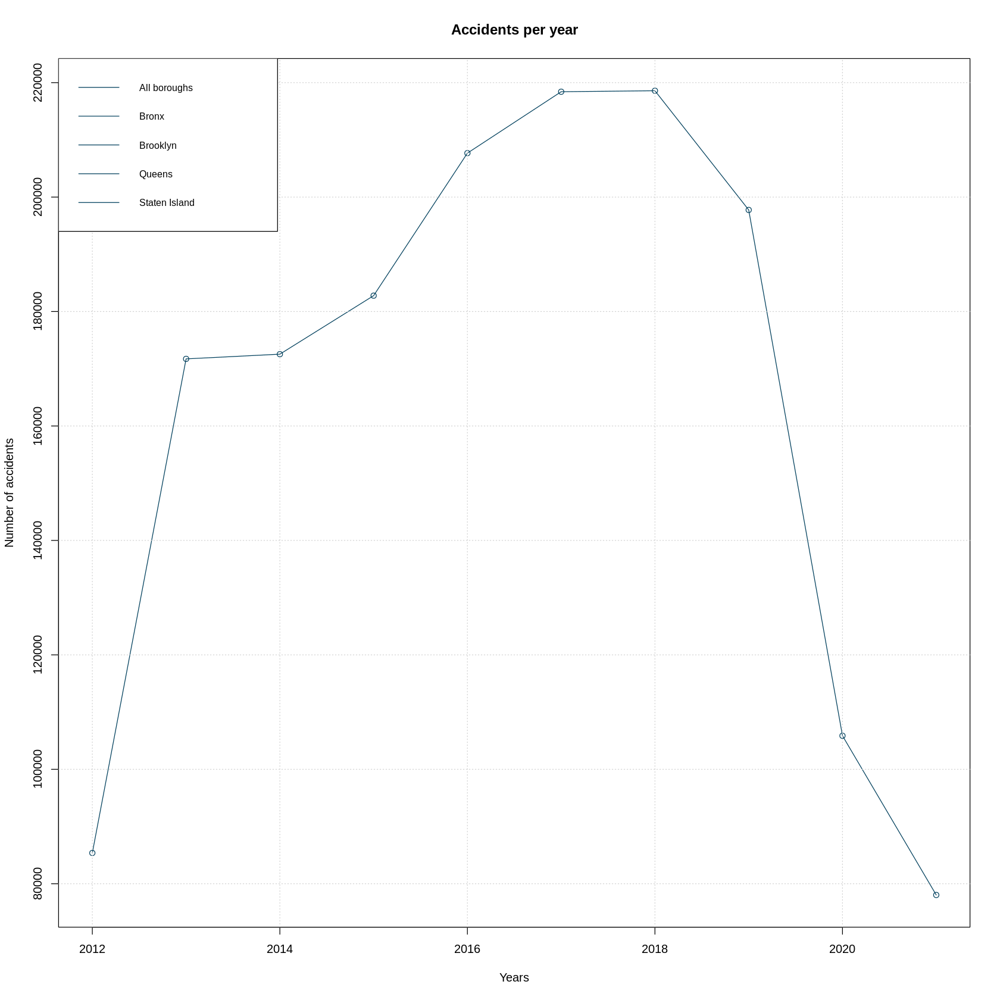

In [38]:
# plot the output by borough
plot(
  years, 
  total_collisions, 
  type = 'o', 
  col = "#003f5c",
  main = "Accidents per year",
  xlab = "Years",
  ylab = "Number of accidents",
  lty = 1
)
grid()
legend("topleft", legend=c("All boroughs", "Bronx", "Brooklyn", "Queens", "Staten Island"), col=c("#003f5c"), lty = 1:1, cex=0.8)

As SQLDF is being used, it is possbile to drill down to show the number of accidents per borough.  To do this, more queies will be needed (as above) and these queries executed and loaded into arrays.

This is performed in the following code block:

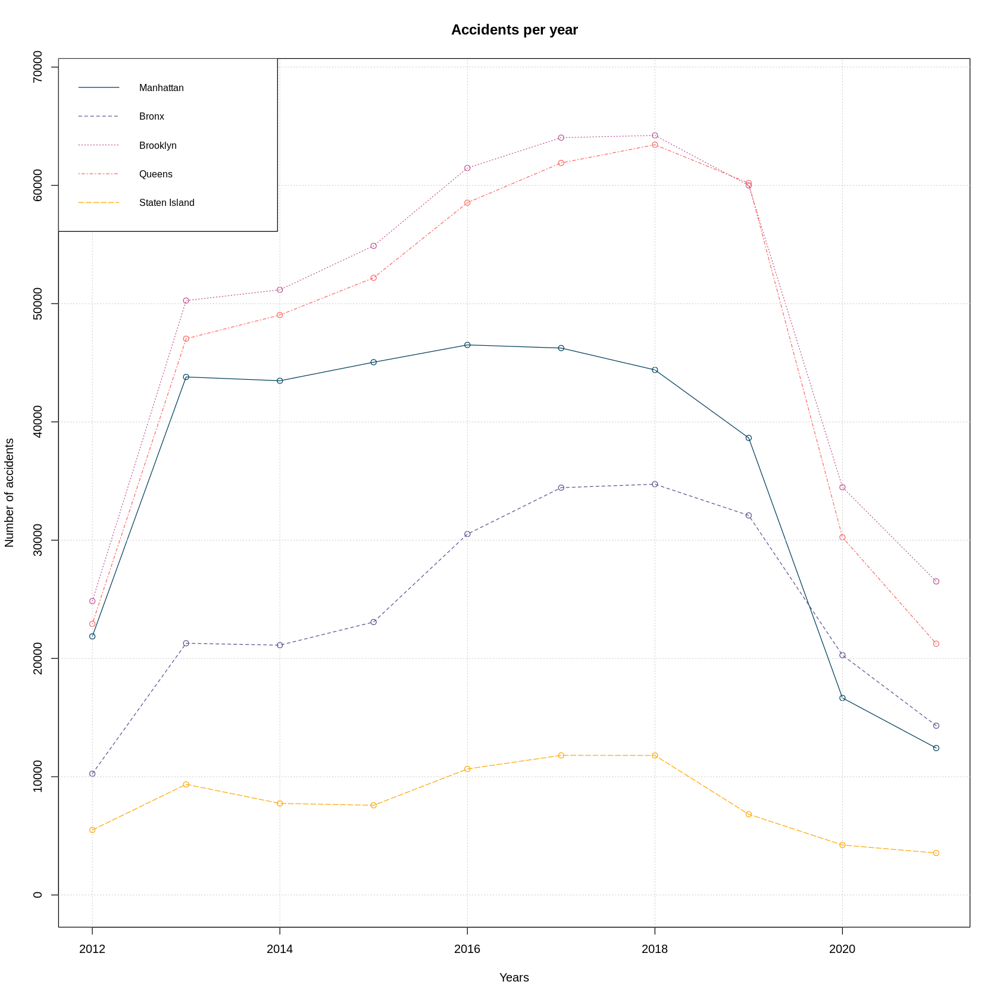

In [39]:

# manhattan
collision_query_2012_MH = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2012" AND BOROUGH = "MANHATTAN"'
collision_query_2013_MH = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2013" AND BOROUGH = "MANHATTAN"'
collision_query_2014_MH = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2014" AND BOROUGH = "MANHATTAN"'
collision_query_2015_MH = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2015" AND BOROUGH = "MANHATTAN"'
collision_query_2016_MH = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2016" AND BOROUGH = "MANHATTAN"'
collision_query_2017_MH = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2017" AND BOROUGH = "MANHATTAN"'
collision_query_2018_MH = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2018" AND BOROUGH = "MANHATTAN"'
collision_query_2019_MH = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2019" AND BOROUGH = "MANHATTAN"'
collision_query_2020_MH = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2020" AND BOROUGH = "MANHATTAN"'
collision_query_2021_MH = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2021" AND BOROUGH = "MANHATTAN"'

# bronx
collision_query_2012_BR = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2012" AND BOROUGH = "BRONX"'
collision_query_2013_BR = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2013" AND BOROUGH = "BRONX"'
collision_query_2014_BR = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2014" AND BOROUGH = "BRONX"'
collision_query_2015_BR = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2015" AND BOROUGH = "BRONX"'
collision_query_2016_BR = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2016" AND BOROUGH = "BRONX"'
collision_query_2017_BR = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2017" AND BOROUGH = "BRONX"'
collision_query_2018_BR = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2018" AND BOROUGH = "BRONX"'
collision_query_2019_BR = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2019" AND BOROUGH = "BRONX"'
collision_query_2020_BR = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2020" AND BOROUGH = "BRONX"'
collision_query_2021_BR = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2021" AND BOROUGH = "BRONX"'

# brooklyn
collision_query_2012_BK = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2012" AND BOROUGH = "BROOKLYN"'
collision_query_2013_BK = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2013" AND BOROUGH = "BROOKLYN"'
collision_query_2014_BK = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2014" AND BOROUGH = "BROOKLYN"'
collision_query_2015_BK = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2015" AND BOROUGH = "BROOKLYN"'
collision_query_2016_BK = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2016" AND BOROUGH = "BROOKLYN"'
collision_query_2017_BK = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2017" AND BOROUGH = "BROOKLYN"'
collision_query_2018_BK = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2018" AND BOROUGH = "BROOKLYN"'
collision_query_2019_BK = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2019" AND BOROUGH = "BROOKLYN"'
collision_query_2020_BK = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2020" AND BOROUGH = "BROOKLYN"'
collision_query_2021_BK = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2021" AND BOROUGH = "BROOKLYN"'

# queens
collision_query_2012_QU = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2012" AND BOROUGH = "QUEENS"'
collision_query_2013_QU = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2013" AND BOROUGH = "QUEENS"'
collision_query_2014_QU = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2014" AND BOROUGH = "QUEENS"'
collision_query_2015_QU = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2015" AND BOROUGH = "QUEENS"'
collision_query_2016_QU = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2016" AND BOROUGH = "QUEENS"'
collision_query_2017_QU = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2017" AND BOROUGH = "QUEENS"'
collision_query_2018_QU = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2018" AND BOROUGH = "QUEENS"'
collision_query_2019_QU = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2019" AND BOROUGH = "QUEENS"'
collision_query_2020_QU = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2020" AND BOROUGH = "QUEENS"'
collision_query_2021_QU = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2021" AND BOROUGH = "QUEENS"'

# staten islans
collision_SIery_2012_SI = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2012" AND BOROUGH = "STATEN ISLAND"'
collision_SIery_2013_SI = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2013" AND BOROUGH = "STATEN ISLAND"'
collision_SIery_2014_SI = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2014" AND BOROUGH = "STATEN ISLAND"'
collision_SIery_2015_SI = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2015" AND BOROUGH = "STATEN ISLAND"'
collision_SIery_2016_SI = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2016" AND BOROUGH = "STATEN ISLAND"'
collision_SIery_2017_SI = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2017" AND BOROUGH = "STATEN ISLAND"'
collision_SIery_2018_SI = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2018" AND BOROUGH = "STATEN ISLAND"'
collision_SIery_2019_SI = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2019" AND BOROUGH = "STATEN ISLAND"'
collision_SIery_2020_SI = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2020" AND BOROUGH = "STATEN ISLAND"'
collision_SIery_2021_SI = 'SELECT sum(NUM_COLS) as COLS FROM file WHERE YEAR = "2021" AND BOROUGH = "STATEN ISLAND"'

# return the data from the SQL query for manhattan
collisions_2012_MH = read.csv.sql(data_all, collision_query_2012_MH)
collisions_2013_MH = read.csv.sql(data_all, collision_query_2013_MH)
collisions_2014_MH = read.csv.sql(data_all, collision_query_2014_MH)
collisions_2015_MH = read.csv.sql(data_all, collision_query_2015_MH)
collisions_2016_MH = read.csv.sql(data_all, collision_query_2016_MH)
collisions_2017_MH = read.csv.sql(data_all, collision_query_2017_MH)
collisions_2018_MH = read.csv.sql(data_all, collision_query_2018_MH)
collisions_2019_MH = read.csv.sql(data_all, collision_query_2019_MH)
collisions_2020_MH = read.csv.sql(data_all, collision_query_2020_MH)
collisions_2021_MH = read.csv.sql(data_all, collision_query_2021_MH)

# return the data from the SQL query for bronx
collisions_2012_BR = read.csv.sql(data_all, collision_query_2012_BR)
collisions_2013_BR = read.csv.sql(data_all, collision_query_2013_BR)
collisions_2014_BR = read.csv.sql(data_all, collision_query_2014_BR)
collisions_2015_BR = read.csv.sql(data_all, collision_query_2015_BR)
collisions_2016_BR = read.csv.sql(data_all, collision_query_2016_BR)
collisions_2017_BR = read.csv.sql(data_all, collision_query_2017_BR)
collisions_2018_BR = read.csv.sql(data_all, collision_query_2018_BR)
collisions_2019_BR = read.csv.sql(data_all, collision_query_2019_BR)
collisions_2020_BR = read.csv.sql(data_all, collision_query_2020_BR)
collisions_2021_BR = read.csv.sql(data_all, collision_query_2021_BR)

# return the data from the SQL query for brooklym
collisions_2012_BK = read.csv.sql(data_all, collision_query_2012_BK)
collisions_2013_BK = read.csv.sql(data_all, collision_query_2013_BK)
collisions_2014_BK = read.csv.sql(data_all, collision_query_2014_BK)
collisions_2015_BK = read.csv.sql(data_all, collision_query_2015_BK)
collisions_2016_BK = read.csv.sql(data_all, collision_query_2016_BK)
collisions_2017_BK = read.csv.sql(data_all, collision_query_2017_BK)
collisions_2018_BK = read.csv.sql(data_all, collision_query_2018_BK)
collisions_2019_BK = read.csv.sql(data_all, collision_query_2019_BK)
collisions_2020_BK = read.csv.sql(data_all, collision_query_2020_BK)
collisions_2021_BK = read.csv.sql(data_all, collision_query_2021_BK)

# return the data from the SQL query for queens
collisions_2012_QU = read.csv.sql(data_all, collision_query_2012_QU)
collisions_2013_QU = read.csv.sql(data_all, collision_query_2013_QU)
collisions_2014_QU = read.csv.sql(data_all, collision_query_2014_QU)
collisions_2015_QU = read.csv.sql(data_all, collision_query_2015_QU)
collisions_2016_QU = read.csv.sql(data_all, collision_query_2016_QU)
collisions_2017_QU = read.csv.sql(data_all, collision_query_2017_QU)
collisions_2018_QU = read.csv.sql(data_all, collision_query_2018_QU)
collisions_2019_QU = read.csv.sql(data_all, collision_query_2019_QU)
collisions_2020_QU = read.csv.sql(data_all, collision_query_2020_QU)
collisions_2021_QU = read.csv.sql(data_all, collision_query_2021_QU)

# return the data from the SQL query for staten island
collisions_2012_SI = read.csv.sql(data_all, collision_SIery_2012_SI)
collisions_2013_SI = read.csv.sql(data_all, collision_SIery_2013_SI)
collisions_2014_SI = read.csv.sql(data_all, collision_SIery_2014_SI)
collisions_2015_SI = read.csv.sql(data_all, collision_SIery_2015_SI)
collisions_2016_SI = read.csv.sql(data_all, collision_SIery_2016_SI)
collisions_2017_SI = read.csv.sql(data_all, collision_SIery_2017_SI)
collisions_2018_SI = read.csv.sql(data_all, collision_SIery_2018_SI)
collisions_2019_SI = read.csv.sql(data_all, collision_SIery_2019_SI)
collisions_2020_SI = read.csv.sql(data_all, collision_SIery_2020_SI)
collisions_2021_SI = read.csv.sql(data_all, collision_SIery_2021_SI)

# create an array of number of accidents
collisions_MH <- c(collisions_2012_MH[[1]],collisions_2013_MH[[1]],collisions_2014_MH[[1]],collisions_2015_MH[[1]],collisions_2016_MH[[1]],collisions_2017_MH[[1]],collisions_2018_MH[[1]],collisions_2019_MH[[1]],collisions_2020_MH[[1]],collisions_2021_MH[[1]])
collisions_BR <- c(collisions_2012_BR[[1]],collisions_2013_BR[[1]],collisions_2014_BR[[1]],collisions_2015_BR[[1]],collisions_2016_BR[[1]],collisions_2017_BR[[1]],collisions_2018_BR[[1]],collisions_2019_BR[[1]],collisions_2020_BR[[1]],collisions_2021_BR[[1]])
collisions_BK <- c(collisions_2012_BK[[1]],collisions_2013_BK[[1]],collisions_2014_BK[[1]],collisions_2015_BK[[1]],collisions_2016_BK[[1]],collisions_2017_BK[[1]],collisions_2018_BK[[1]],collisions_2019_BK[[1]],collisions_2020_BK[[1]],collisions_2021_BK[[1]])
collisions_QU <- c(collisions_2012_QU[[1]],collisions_2013_QU[[1]],collisions_2014_QU[[1]],collisions_2015_QU[[1]],collisions_2016_QU[[1]],collisions_2017_QU[[1]],collisions_2018_QU[[1]],collisions_2019_QU[[1]],collisions_2020_QU[[1]],collisions_2021_QU[[1]])
collisions_SI <- c(collisions_2012_SI[[1]],collisions_2013_SI[[1]],collisions_2014_SI[[1]],collisions_2015_SI[[1]],collisions_2016_SI[[1]],collisions_2017_SI[[1]],collisions_2018_SI[[1]],collisions_2019_SI[[1]],collisions_2020_SI[[1]],collisions_2021_SI[[1]])

# plot the output by borough
plot(
  years, 
  collisions_MH, 
  type = 'o', 
  col = "#003f5c",
  main = "Accidents per year",
  xlab = "Years",
  ylab = "Number of accidents",
  ylim = c(0,68000),
  lty = 1
)
lines(years, collisions_BR, type="o", col="#58508d", lty = 2)
lines(years, collisions_BK, type="o", col="#bc5090", lty = 3)
lines(years, collisions_QU, type="o", col="#ff6361", lty = 4)
lines(years, collisions_SI, type="o", col="#ffa600", lty = 5)
grid()
legend("topleft", legend=c("Manhattan", "Bronx", "Brooklyn", "Queens", "Staten Island"), col=c("#003f5c", "#58508d", "#bc5090", "#ff6361", "#ffa600"), lty = 1:5, cex=0.8)

From looking at the graph, it would seem that the number of accidents rocketed in 2013 from 2012, however, looking back at the write up for part 1 of the assignment, the earliest date we had collision data for was found using the following sql:

```sql
SELECT MIN(timestamp) FROM `bigquery-public-data.new_york_mv_collisions.ypd_mv_collisions`
```
Which returned a value of **2012-07-01T00:05:00**

So, it would seem there is less than half a years data for 2012.  

Looking at the graph, there is also a huge trend downwards from 2019 to 2020 (and a further decrease in 2021.)  What does this mean?  Looking at the news we know that New York entered lockdown during March 2020 (reference: https://www.investopedia.com/historical-timeline-of-covid-19-in-new-york-city-5071986)

So if the above graph was to be replotted without 2012, 2020 and 2021 (as lockdown rules were still in effect) then the following would be produced:

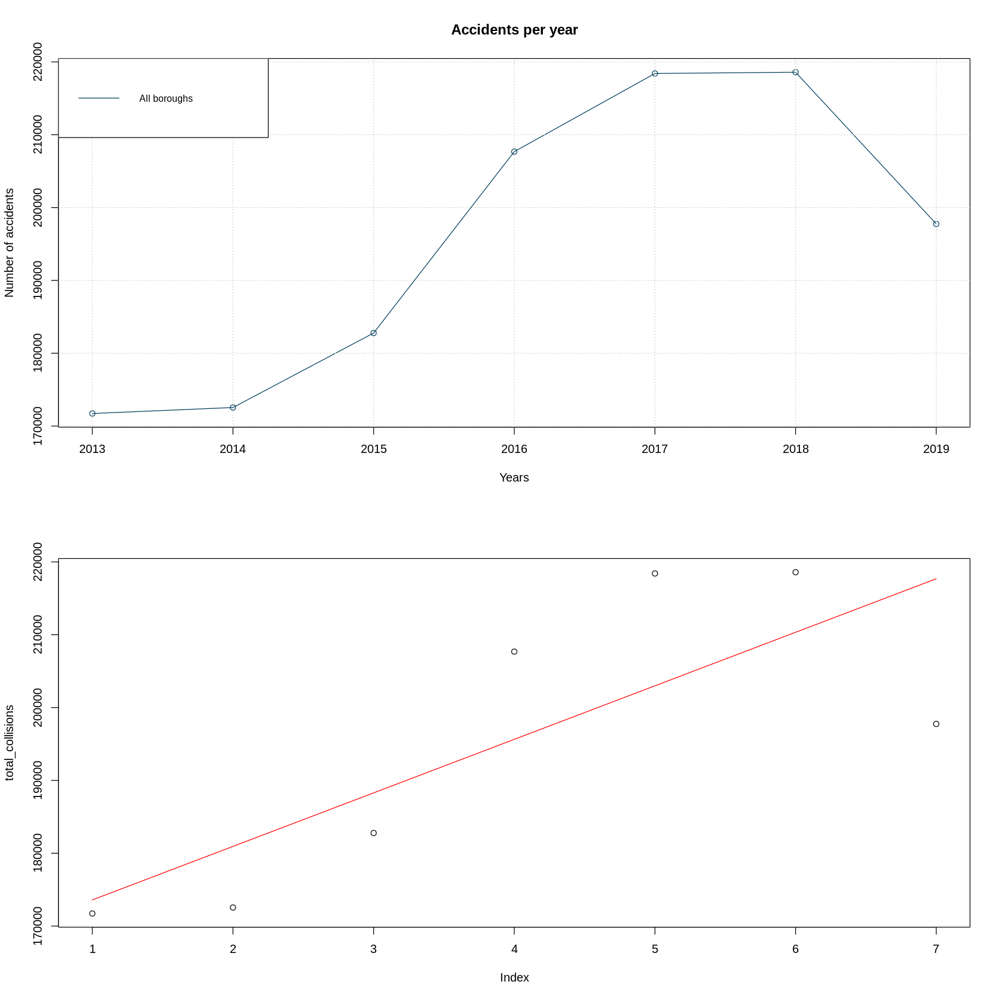

In [40]:
par(mfrow=c(2,1))
years <- c("2013", "2014", "2015", "2016", "2017", "2018", "2019")
total_collisions <- c(collisions_2013[[1]],collisions_2014[[1]],collisions_2015[[1]],collisions_2016[[1]],collisions_2017[[1]],collisions_2018[[1]],collisions_2019[[1]])
x <- (1:length(total_collisions))

plot(
  years, 
  total_collisions, 
  type = 'o', 
  col = "#003f5c",
  main = "Accidents per year",
  xlab = "Years",
  ylab = "Number of accidents",
  lty = 1
)
grid()
legend("topleft", legend=c("All boroughs"), col=c("#003f5c"), lty = 1:1, cex=0.8)

# trendline plot
plot(total_collisions)
#add linear trend
lines(predict(lm(total_collisions~x)),col='red')

A second plot has been added under the main plot.  As can be seen the second plot has a trendline.  This trendline shows, generally, that the number of collirions increases until the pandemic.  

For the following, the 2012 and 2020/2021 figures will be removed.

Breaking this down to individual boroughs with the code below shows the following:

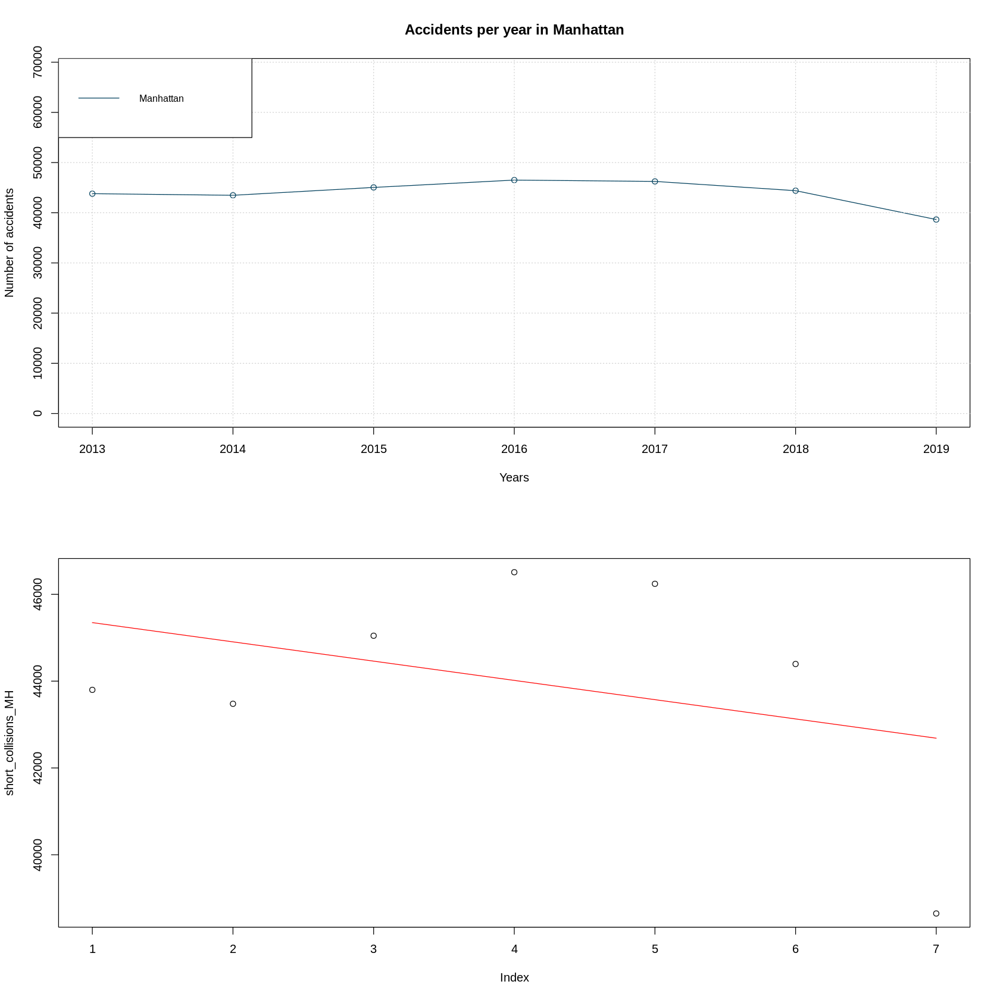

In [41]:
years <- c("2013", "2014", "2015", "2016", "2017", "2018", "2019")
short_collisions_MH <- c(collisions_2013_MH[[1]],collisions_2014_MH[[1]],collisions_2015_MH[[1]],collisions_2016_MH[[1]],collisions_2017_MH[[1]],collisions_2018_MH[[1]],collisions_2019_MH[[1]])
short_collisions_BR <- c(collisions_2013_BR[[1]],collisions_2014_BR[[1]],collisions_2015_BR[[1]],collisions_2016_BR[[1]],collisions_2017_BR[[1]],collisions_2018_BR[[1]],collisions_2019_BR[[1]])
short_collisions_BK <- c(collisions_2013_BK[[1]],collisions_2014_BK[[1]],collisions_2015_BK[[1]],collisions_2016_BK[[1]],collisions_2017_BK[[1]],collisions_2018_BK[[1]],collisions_2019_BK[[1]])
short_collisions_QU <- c(collisions_2013_QU[[1]],collisions_2014_QU[[1]],collisions_2015_QU[[1]],collisions_2016_QU[[1]],collisions_2017_QU[[1]],collisions_2018_QU[[1]],collisions_2019_QU[[1]])
short_collisions_SI <- c(collisions_2013_SI[[1]],collisions_2014_SI[[1]],collisions_2015_SI[[1]],collisions_2016_SI[[1]],collisions_2017_SI[[1]],collisions_2018_SI[[1]],collisions_2019_SI[[1]])

par(mfrow=c(2,1))
x <- (1:length(short_collisions_MH))

# manhattan
plot(
  years, 
  short_collisions_MH, 
  type = 'o', 
  col = "#003f5c",
  main = "Accidents per year in Manhattan",
  xlab = "Years",
  ylab = "Number of accidents",
  ylim = c(0,68000),
  lty = 1
)
grid()
legend("topleft", legend=c("Manhattan"), col=c("#003f5c"), lty = 1:1, cex=0.8)

# trendline plot
plot(short_collisions_MH)
#add linear trend
lines(predict(lm(short_collisions_MH~x)),col='red')


Using the trednline example from above, the same analysis can be performed on each of the boroughs:


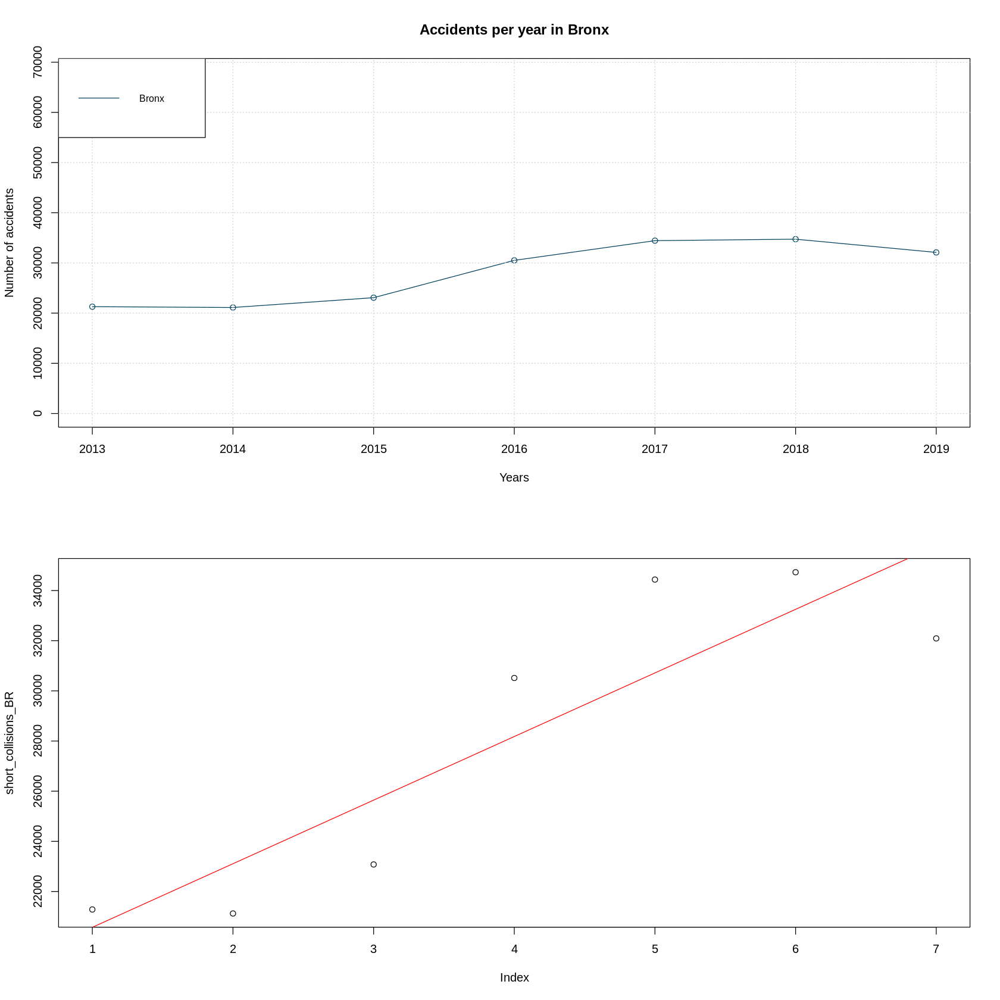

In [42]:
# bronx
par(mfrow=c(2,1))
x <- (1:length(short_collisions_BR))
plot(
  years, 
  short_collisions_BR, 
  type = 'o', 
  col = "#003f5c",
  main = "Accidents per year in Bronx",
  xlab = "Years",
  ylab = "Number of accidents",
  ylim = c(0,68000),
  lty = 1
)
grid()
legend("topleft", legend=c("Bronx"), col=c("#003f5c"), lty = 1:1, cex=0.8)

# trendline plot
plot(short_collisions_BR)
#add linear trend
lines(predict(lm(short_collisions_BR~x)),col='red')



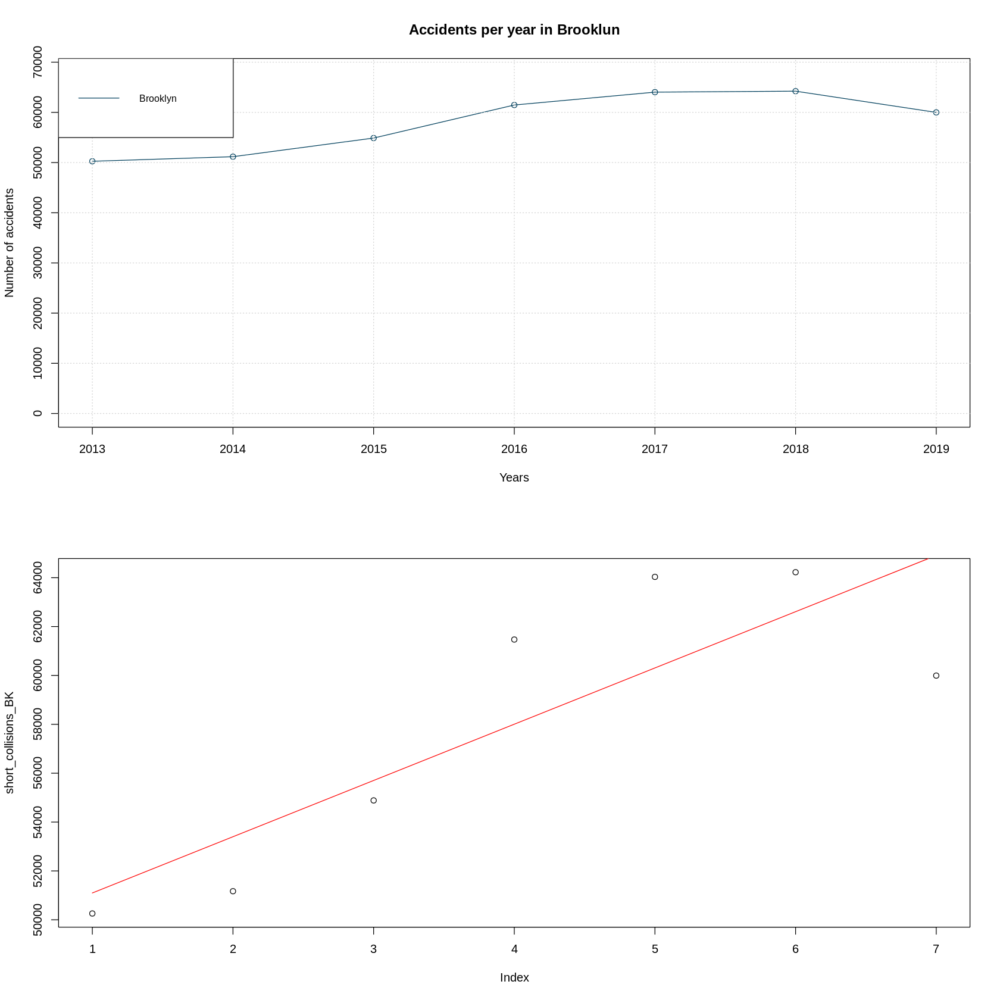

In [43]:
# brooklyn
par(mfrow=c(2,1))
x <- (1:length(short_collisions_BK))
plot(
  years, 
  short_collisions_BK, 
  type = 'o', 
  col = "#003f5c",
  main = "Accidents per year in Brooklun",
  xlab = "Years",
  ylab = "Number of accidents",
  ylim = c(0,68000),
  lty = 1
)
grid()
legend("topleft", legend=c("Brooklyn"), col=c("#003f5c"), lty = 1:1, cex=0.8)

# trendline plot
plot(short_collisions_BK)
#add linear trend
lines(predict(lm(short_collisions_BK~x)),col='red')

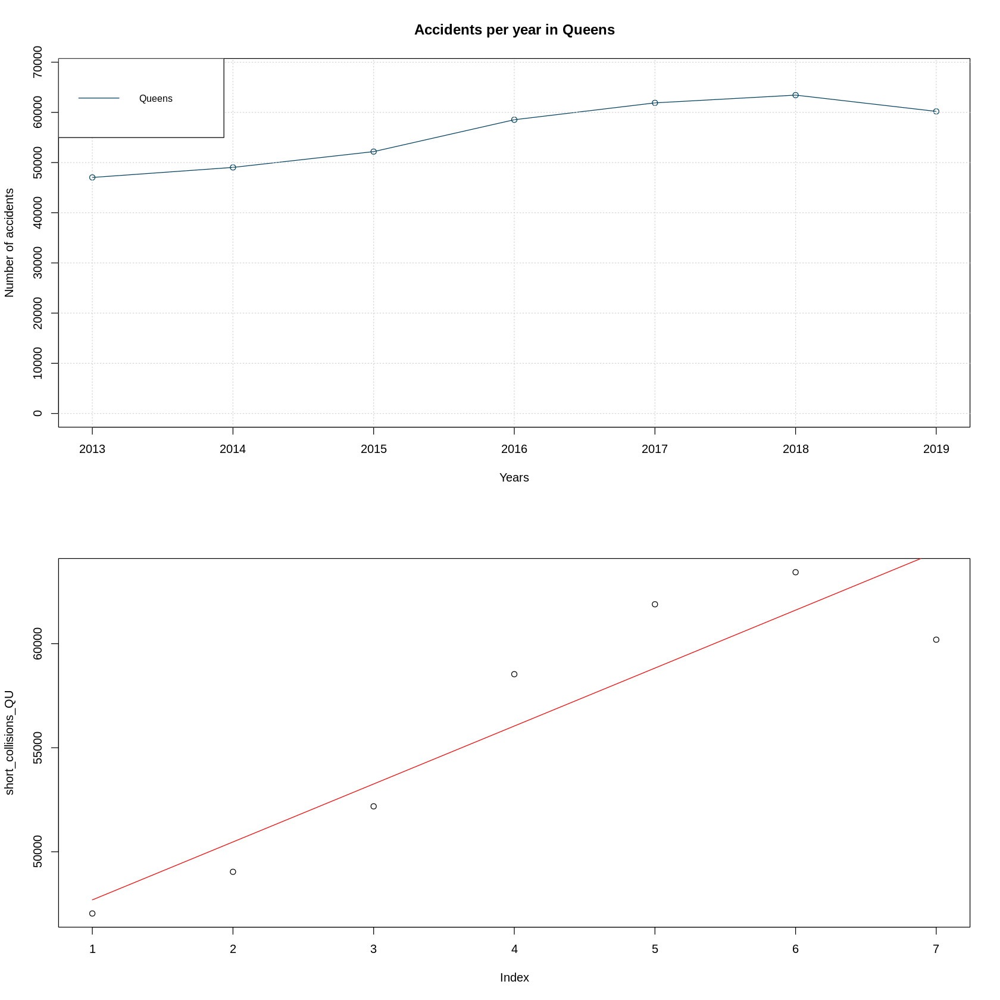

In [44]:
# queens
par(mfrow=c(2,1))
x <- (1:length(short_collisions_QU))
plot(
  years, 
  short_collisions_QU, 
  type = 'o', 
  col = "#003f5c",
  main = "Accidents per year in Queens",
  xlab = "Years",
  ylab = "Number of accidents",
  ylim = c(0,68000),
  lty = 1
)
grid()
legend("topleft", legend=c("Queens"), col=c("#003f5c"), lty = 1:1, cex=0.8)

# trendline plot
plot(short_collisions_QU)
#add linear trend
lines(predict(lm(short_collisions_QU~x)),col='red')

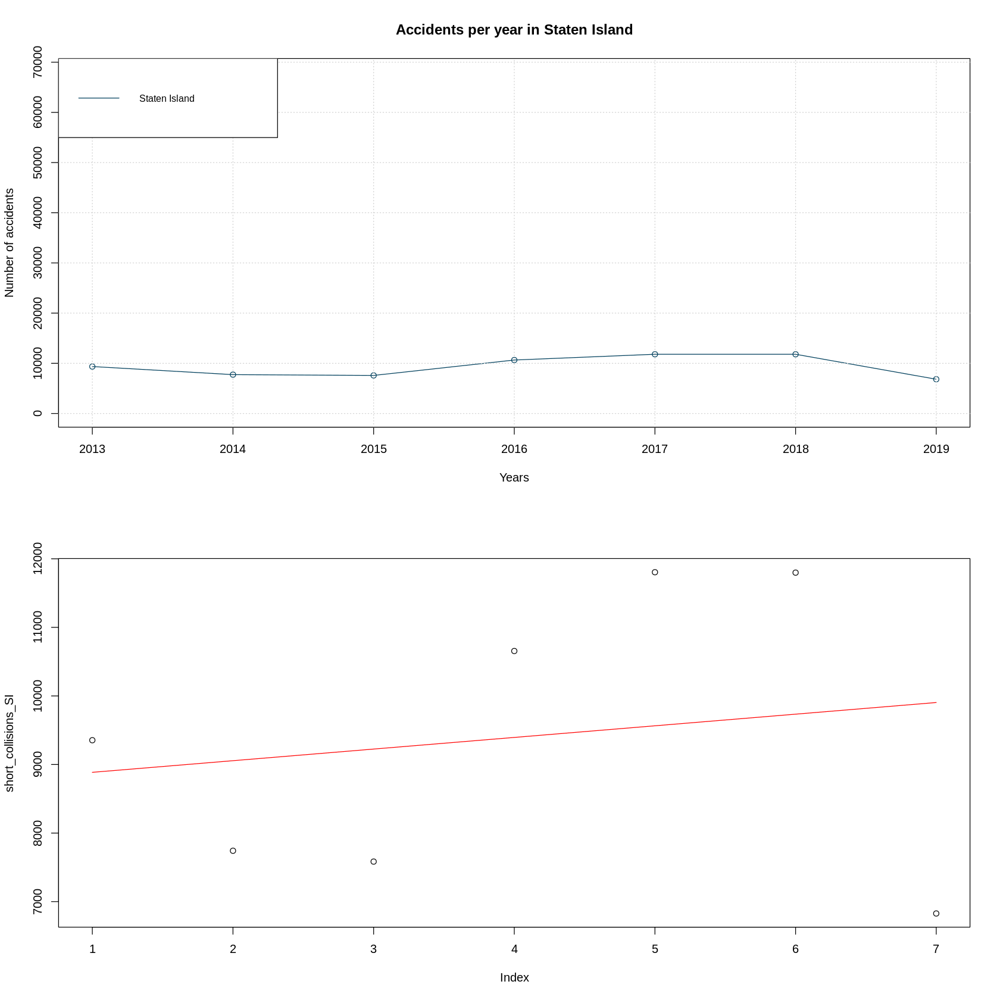

In [45]:
# staten island
par(mfrow=c(2,1))
x <- (1:length(short_collisions_SI))
plot(
  years, 
  short_collisions_SI, 
  type = 'o', 
  col = "#003f5c",
  main = "Accidents per year in Staten Island",
  xlab = "Years",
  ylab = "Number of accidents",
  ylim = c(0,68000),
  lty = 1
)
grid()
legend("topleft", legend=c("Staten Island"), col=c("#003f5c"), lty = 1:1, cex=0.8)

# trendline plot
plot(short_collisions_SI)
#add linear trend
lines(predict(lm(short_collisions_SI~x)),col='red')

## Introducing weather

The original question releated to weather and the effect this had on number of accidents.

The trendlines show that each of the boroughs with the exception of manhattan was showing an increase in the number of accidents.


### Temperature

First, looking at Temperature (the mean temperature as per the definition from the dataset.)

Plotting this out, per borough, shows the following:

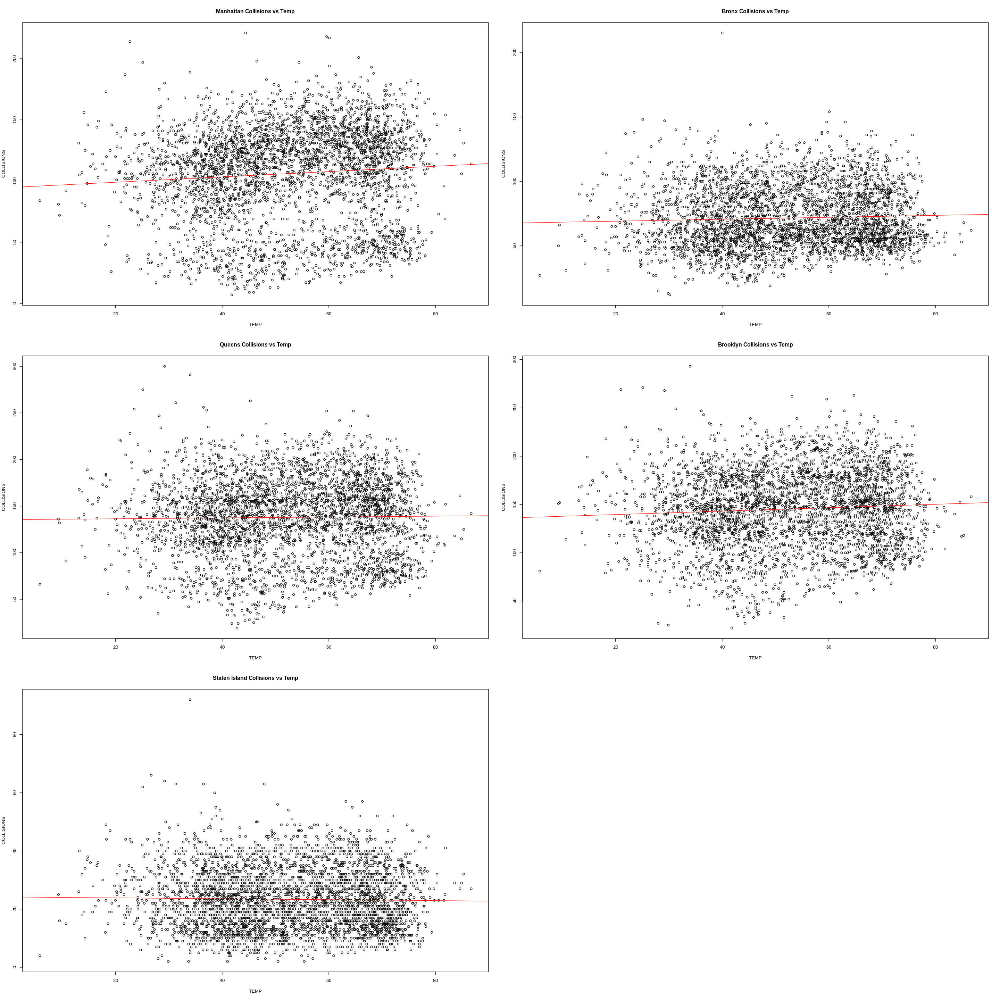

In [46]:
# queries
manhattan_query = 'SELECT * FROM file WHERE BOROUGH="MANHATTAN" AND (YEAR != "2012" OR YEAR != "2020" OR YEAR != "2021")'
bronx_query = 'SELECT * FROM file WHERE BOROUGH="BRONX" AND (YEAR != "2012" OR YEAR != "2020" OR YEAR != "2021")'
queens_query = 'SELECT * FROM file WHERE BOROUGH="QUEENS" AND (YEAR != "2012" OR YEAR != "2020" OR YEAR != "2021")'
staten_island_query = 'SELECT * FROM file WHERE BOROUGH="STATEN ISLAND" AND (YEAR != "2012" OR YEAR != "2020" OR YEAR != "2021")'
brooklyn_query = 'SELECT * FROM file WHERE BOROUGH="BROOKLYN" AND (YEAR != "2012" OR YEAR != "2020" OR YEAR != "2021")'

# # get the data

all_manhattan_data = read.csv.sql(data_all, manhattan_query)
all_bronx_data = read.csv.sql(data_all, bronx_query)
all_queens_data = read.csv.sql(data_all, queens_query)
all_staten_island_data = read.csv.sql(data_all, staten_island_query)
all_brooklyn_data = read.csv.sql(data_all, brooklyn_query)

options(repr.plot.width=24, repr.plot.height=24)
par(mfrow=c(3,2))
# manhattan plots

plot(
  all_manhattan_data$TEMP, 
  all_manhattan_data$NUM_COLS, 
  xlab="TEMP", 
  ylab="COLLISIONS", 
  main="Manhattan Collisions vs Temp",
 
)
abline(lm(all_manhattan_data$NUM_COLS ~ all_manhattan_data$TEMP), col = "red") 

# bronx plots

plot(
  all_bronx_data$TEMP, 
  all_bronx_data$NUM_COLS, 
  xlab="TEMP", 
  ylab="COLLISIONS", 
  main="Bronx Collisions vs Temp",
 
)
abline(lm(all_bronx_data$NUM_COLS ~ all_bronx_data$TEMP), col = "red") 

# queens plots

plot(
  all_queens_data$TEMP, 
  all_queens_data$NUM_COLS, 
  xlab="TEMP", 
  ylab="COLLISIONS", 
  main="Queens Collisions vs Temp",
 
)
abline(lm(all_queens_data$NUM_COLS ~ all_queens_data$TEMP), col = "red") 

# brooklyn plots

plot(
  all_brooklyn_data$TEMP, 
  all_brooklyn_data$NUM_COLS, 
  xlab="TEMP", 
  ylab="COLLISIONS", 
  main="Brooklyn Collisions vs Temp",
 
)
abline(lm(all_brooklyn_data$NUM_COLS ~ all_brooklyn_data$TEMP), col = "red") 

# staten island plots

plot(
  all_staten_island_data$TEMP, 
  all_staten_island_data$NUM_COLS, 
  xlab="TEMP", 
  ylab="COLLISIONS", 
  main="Staten Island Collisions vs Temp",
 
)
abline(lm(all_staten_island_data$NUM_COLS ~ all_staten_island_data$TEMP), col = "red") 

#### Manhattan Temperatures

The code below recreates the scatter plot above (complete with the best fit line) as both a bar plot and a histogram.  

The scatterplot best fit line does suggest that as the temperature increases, the number of accidents increase.  This is further backed bu the spike at around the 70 - 71.5 degree mark on the barplot.  While the hostogram does not provide a label for the spie it does tend to match.

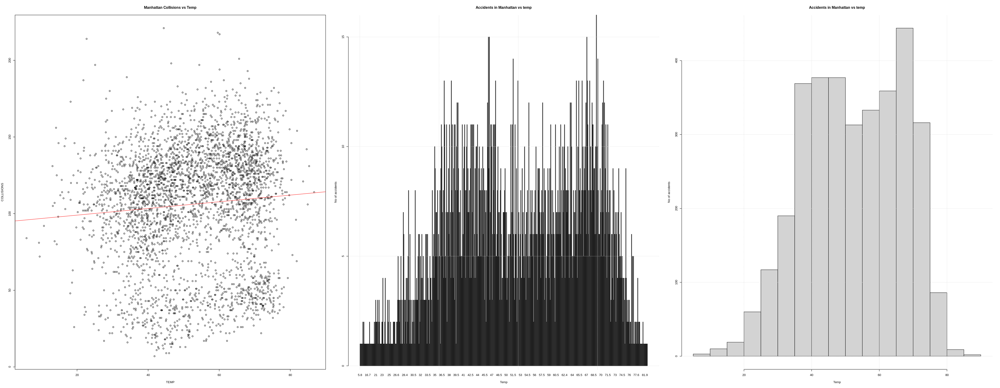

In [47]:
options(repr.plot.width=36, repr.plot.height=14)
par(mfrow=c(1,3))
# manhattan plots

plot(
  all_manhattan_data$TEMP, 
  all_manhattan_data$NUM_COLS, 
  xlab="TEMP", 
  ylab="COLLISIONS", 
  main="Manhattan Collisions vs Temp",
 
)
abline(lm(all_manhattan_data$NUM_COLS ~ all_manhattan_data$TEMP), col = "red") 

counts <- table(all_manhattan_data$TEMP)
barplot(
  counts,
  main = "Accidents in Manhattan vs temp",
  xlab = "Temp",
  ylab = "No of accidents",
)
grid()

hist(
  all_manhattan_data$TEMP,  
  main = "Accidents in Manhattan vs temp",
  xlab = "Temp",
  ylab = "No of accidents"
)
grid()

#### Bronx Temperature

The code below recreates the scatter plot above (complete with the best fit line) as both a bar plot and a histogram.  

The scatterplot best fit line does suggest that as the temperature increases, the number of accidents increase.  This is further backed bu the spike at around the 71.5 - 73 degree mark on the barplot.  While the hostogram does not provide a label for the spie it does tend to match.

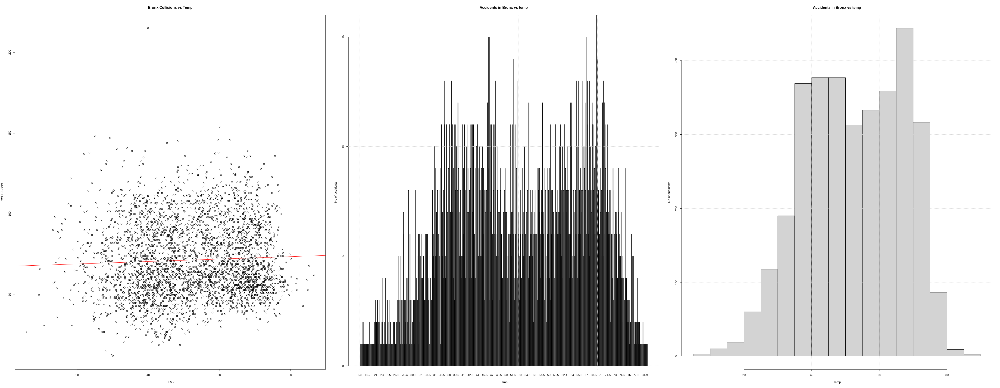

In [48]:
options(repr.plot.width=36, repr.plot.height=14)
par(mfrow=c(1,3))
# bronx plots

plot(
  all_bronx_data$TEMP, 
  all_bronx_data$NUM_COLS, 
  xlab="TEMP", 
  ylab="COLLISIONS", 
  main="Bronx Collisions vs Temp",
 
)
abline(lm(all_bronx_data$NUM_COLS ~ all_bronx_data$TEMP), col = "red") 

counts <- table(all_bronx_data$TEMP)
barplot(
  counts,
  main = "Accidents in Bronx vs temp",
  xlab = "Temp",
  ylab = "No of accidents",
)
grid()

hist(
  all_bronx_data$TEMP,  
  main = "Accidents in Bronx vs temp",
  xlab = "Temp",
  ylab = "No of accidents"
)
grid()

#### Queens Temperature

The code below recreates the scatter plot above (complete with the best fit line) as both a bar plot and a histogram.  

The scatterplot best fit line does suggest that as the temperature increases, the number of accidents increase.  This is further backed bu the spike at around the 70 - 71.5 degree mark on the barplot.  While the hostogram does not provide a label for the spie it does tend to match.

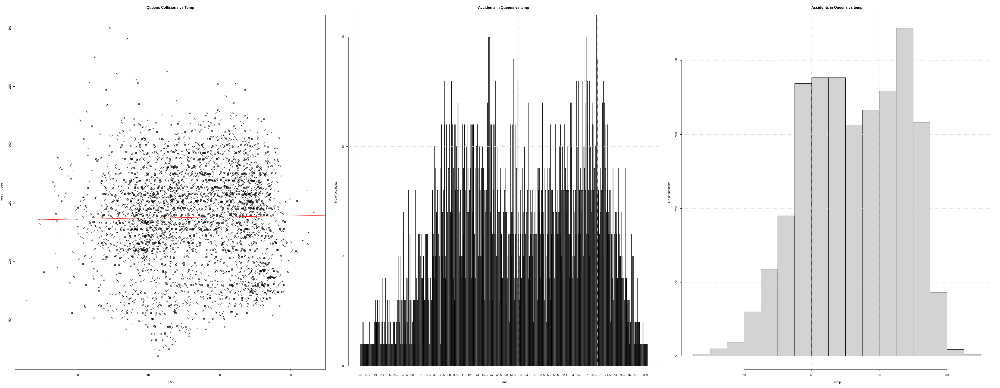

In [49]:
options(repr.plot.width=36, repr.plot.height=14)
par(mfrow=c(1,3))
# queens plots

plot(
  all_queens_data$TEMP, 
  all_queens_data$NUM_COLS, 
  xlab="TEMP", 
  ylab="COLLISIONS", 
  main="Queens Collisions vs Temp",
 
)
abline(lm(all_queens_data$NUM_COLS ~ all_queens_data$TEMP), col = "red") 

counts <- table(all_queens_data$TEMP)
barplot(
  counts,
  main = "Accidents in Queens vs temp",
  xlab = "Temp",
  ylab = "No of accidents",
)
grid()

hist(
  all_queens_data$TEMP,  
  main = "Accidents in Queens vs temp",
  xlab = "Temp",
  ylab = "No of accidents"
)
grid()

#### Brooklyn Temperature

The code below recreates the scatter plot above (complete with the best fit line) as both a bar plot and a histogram.  

The scatterplot best fit line does suggest that as the temperature increases, the number of accidents increase.  This is further backed bu the spike at around the 71 - 72 degree mark on the barplot.  While the hostogram does not provide a label for the spie it does tend to match.

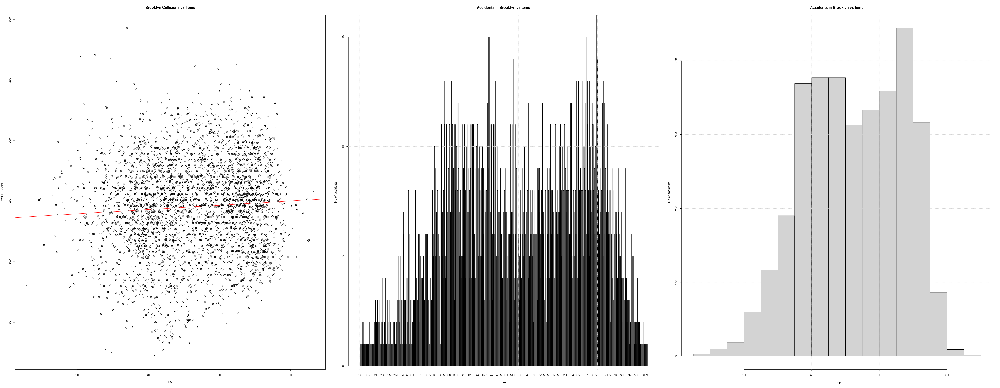

In [50]:
options(repr.plot.width=36, repr.plot.height=14)
par(mfrow=c(1,3))
# brooklyn plots
plot(
  all_brooklyn_data$TEMP, 
  all_brooklyn_data$NUM_COLS, 
  xlab="TEMP", 
  ylab="COLLISIONS", 
  main="Brooklyn Collisions vs Temp",
 
)
abline(lm(all_brooklyn_data$NUM_COLS ~ all_brooklyn_data$TEMP), col = "red") 

counts <- table(all_brooklyn_data$TEMP)

barplot(
  counts,
  main = "Accidents in Brooklyn vs temp",
  xlab = "Temp",
  ylab = "No of accidents",
)
grid()

hist(
  all_brooklyn_data$TEMP,  
  main = "Accidents in Brooklyn vs temp",
  xlab = "Temp",
  ylab = "No of accidents"
)
grid()

#### Staten Island Temperature

The code below recreates the scatter plot above (complete with the best fit line) as both a bar plot and a histogram.  

The scatterplot best fit line does suggest that as the temperature increases, the number of accidents decreases.  

There are spikes on the barplot at around the 70 degree mark, but looking at the scatterplot there is an outlayer at about the 30degree mark.  This could be relevant, the colder weather could affect this location more than others (however, the lack of any other data points rules this out) - or it could have just been a very small isolated "cold snap" which caused some accidents.

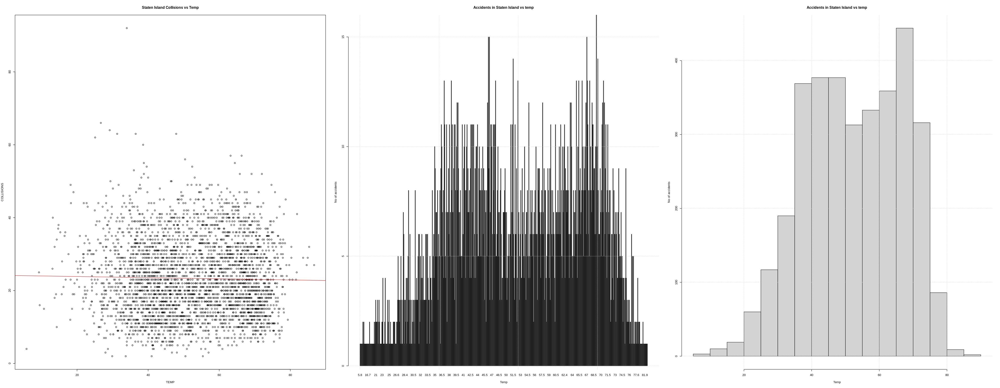

In [51]:
options(repr.plot.width=36, repr.plot.height=14)
par(mfrow=c(1,3))

# staten island plots
plot(
  all_staten_island_data$TEMP, 
  all_staten_island_data$NUM_COLS, 
  xlab="TEMP", 
  ylab="COLLISIONS", 
  main="Staten Island Collisions vs Temp",
 
)
abline(lm(all_staten_island_data$NUM_COLS ~ all_staten_island_data$TEMP), col = "red") 

counts <- table(all_staten_island_data$TEMP)

barplot(
  counts,
  main = "Accidents in Staten Island vs temp",
  xlab = "Temp",
  ylab = "No of accidents",
)
grid()

hist(
  all_staten_island_data$TEMP,  
  main = "Accidents in Staten Island vs temp",
  xlab = "Temp",
  ylab = "No of accidents"
)
grid()

### Temperature Conclusion

Looking at the graphs, it can be seen that in all cases **except** for Staten Island, as the temperature increases, the number of accidents increase.  The above can be repeated for other definitions of "bad weath

### Visibility

Visibility is one of the definitions which are being used to characterise "bad weather" - so the following code will create a graph for each boroughL


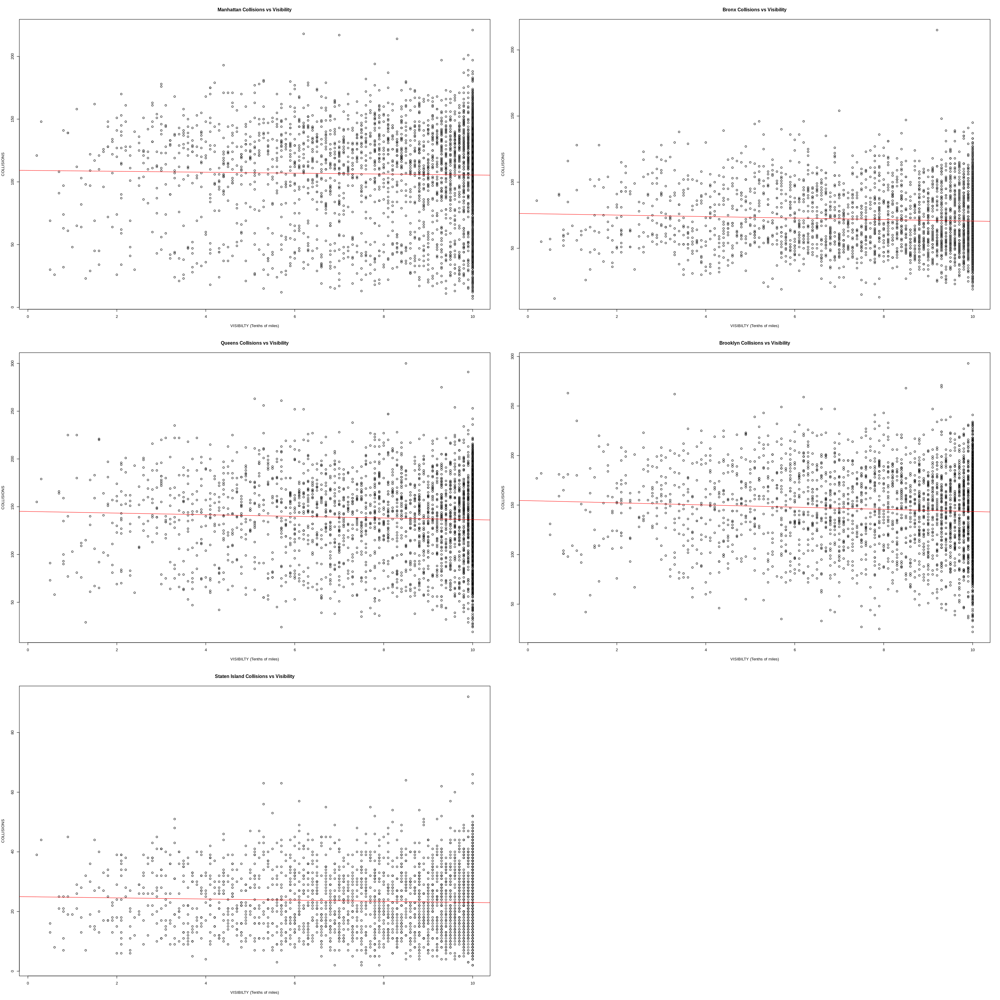

In [52]:
options(repr.plot.width=28, repr.plot.height=28)
par(mfrow=c(3,2))
# manhattan plots

plot(
  all_manhattan_data$VISIB, 
  all_manhattan_data$NUM_COLS, 
  xlab="VISIBILTY (Tenths of miles)", 
  ylab="COLLISIONS", 
  main="Manhattan Collisions vs Visibility",
)
abline(lm(all_manhattan_data$NUM_COLS ~ all_manhattan_data$VISIB), col = "red") 

# bronx plots

plot(
  all_bronx_data$VISIB, 
  all_bronx_data$NUM_COLS, 
  xlab="VISIBILTY (Tenths of miles)", 
  ylab="COLLISIONS", 
  main="Bronx Collisions vs Visibility",
)
abline(lm(all_bronx_data$NUM_COLS ~ all_bronx_data$VISIB), col = "red") 

# queens plots

plot(
  all_queens_data$VISIB, 
  all_queens_data$NUM_COLS, 
  xlab="VISIBILTY (Tenths of miles)", 
  ylab="COLLISIONS", 
  main="Queens Collisions vs Visibility",
)
abline(lm(all_queens_data$NUM_COLS ~ all_queens_data$VISIB), col = "red") 

# brooklyn plots

plot(
  all_brooklyn_data$VISIB, 
  all_brooklyn_data$NUM_COLS, 
  xlab="VISIBILTY (Tenths of miles)", 
  ylab="COLLISIONS", 
  main="Brooklyn Collisions vs Visibility",
)
abline(lm(all_brooklyn_data$NUM_COLS ~ all_brooklyn_data$VISIB), col = "red") 

# staten island plots

plot(
  all_staten_island_data$VISIB, 
  all_staten_island_data$NUM_COLS, 
  xlab="VISIBILTY (Tenths of miles)", 
  ylab="COLLISIONS", 
  main="Staten Island Collisions vs Visibility",
)
abline(lm(all_staten_island_data$NUM_COLS ~ all_staten_island_data$VISIB), col = "red") 

From the lines of best fit, it suggests that visibilty doesn't have an impact on the number of accidents.

Breaking this down:

#### Manhattan Visibility

The code below recreates the scatter plot above (complete with the best fit line) as both a bar plot and a histogram. 

The barplot and histogra add weight to the idea that visibilty doesn't play a factor in the number of car accidents.

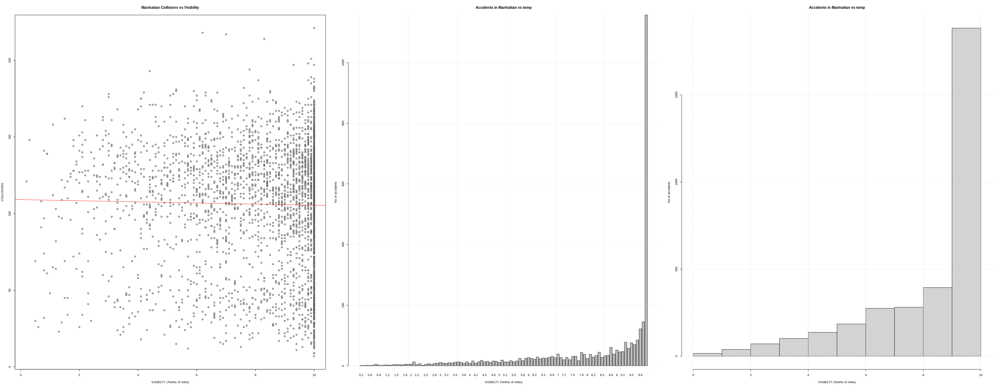

In [53]:
options(repr.plot.width=36, repr.plot.height=14)
par(mfrow=c(1,3))
# manhattan plots

plot(
  all_manhattan_data$VISIB, 
  all_manhattan_data$NUM_COLS, 
  xlab="VISIBILTY (Tenths of miles)", 
  ylab="COLLISIONS", 
  main="Manhattan Collisions vs Visibility",
)
abline(lm(all_manhattan_data$NUM_COLS ~ all_manhattan_data$VISIB), col = "red")

counts <- table(all_manhattan_data$VISIB)
barplot(
  counts,
  main = "Accidents in Manhattan vs temp",
  xlab = "VISIBILTY (Tenths of miles)",
  ylab = "No of accidents",
)
grid()

hist(
  all_manhattan_data$VISIB,  
  main = "Accidents in Manhattan vs temp",
  xlab = "VISIBILTY (Tenths of miles)",
  ylab = "No of accidents"
)
grid()

#### Bronx Visiblity

The code below recreates the scatter plot above (complete with the best fit line) as both a bar plot and a histogram.

The barplot and histogra add weight to the idea that visibilty doesn't play a factor in the number of car accidents.

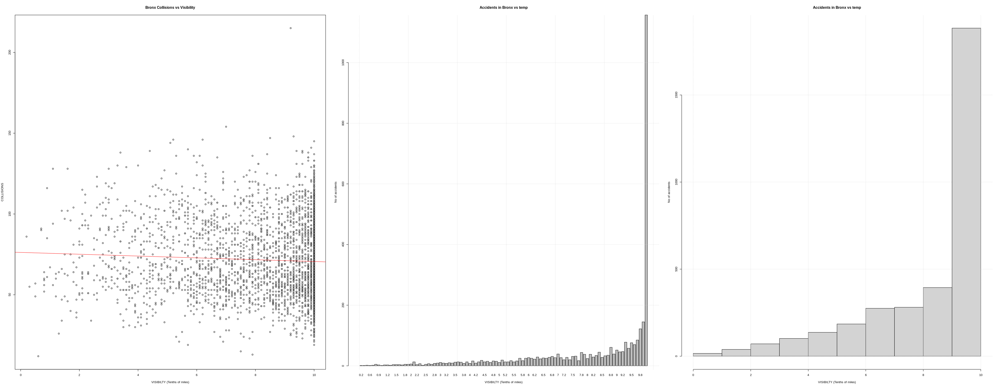

In [54]:
options(repr.plot.width=36, repr.plot.height=14)
par(mfrow=c(1,3))
# bronx plots

plot(
  all_bronx_data$VISIB, 
  all_bronx_data$NUM_COLS, 
  xlab="VISIBILTY (Tenths of miles)", 
  ylab="COLLISIONS", 
  main="Bronx Collisions vs Visibility",
)
abline(lm(all_bronx_data$NUM_COLS ~ all_bronx_data$VISIB), col = "red") 

counts <- table(all_bronx_data$VISIB)
barplot(
  counts,
  main = "Accidents in Bronx vs temp",
  xlab = "VISIBILTY (Tenths of miles)",
  ylab = "No of accidents",
)
grid()

hist(
  all_bronx_data$VISIB,  
  main = "Accidents in Bronx vs temp",
  xlab = "VISIBILTY (Tenths of miles)",
  ylab = "No of accidents"
)
grid()

#### Queens Visibilty

The code below recreates the scatter plot above (complete with the best fit line) as both a bar plot and a histogram.

The barplot and histogra add weight to the idea that visibilty doesn't play a factor in the number of car accidents.

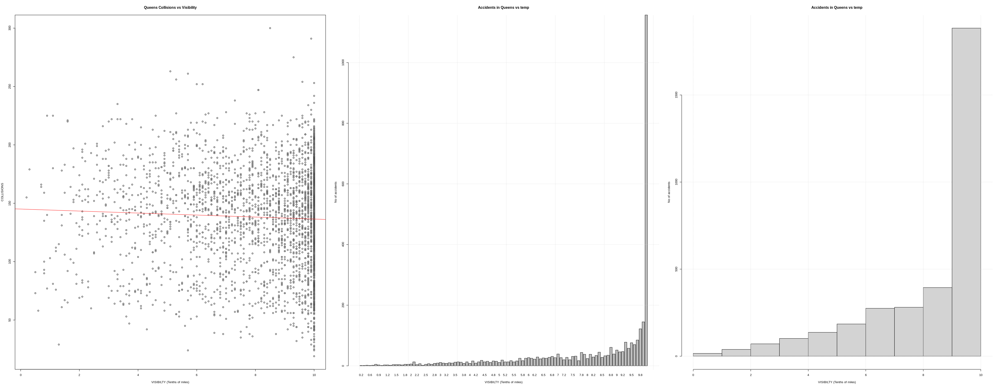

In [55]:
options(repr.plot.width=36, repr.plot.height=14)
par(mfrow=c(1,3))
# queens plots

plot(
  all_queens_data$VISIB, 
  all_queens_data$NUM_COLS, 
  xlab="VISIBILTY (Tenths of miles)", 
  ylab="COLLISIONS", 
  main="Queens Collisions vs Visibility",
)
abline(lm(all_queens_data$NUM_COLS ~ all_queens_data$VISIB), col = "red") 

counts <- table(all_queens_data$VISIB)
barplot(
  counts,
  main = "Accidents in Queens vs temp",
  xlab = "VISIBILTY (Tenths of miles)",
  ylab = "No of accidents",
)
grid()

hist(
  all_queens_data$VISIB,  
  main = "Accidents in Queens vs temp",
  xlab = "VISIBILTY (Tenths of miles)",
  ylab = "No of accidents"
)
grid()

#### Brroklyn Visibility

The code below recreates the scatter plot above (complete with the best fit line) as both a bar plot and a histogram.

The barplot and histogra add weight to the idea that visibilty doesn't play a factor in the number of car accidents.

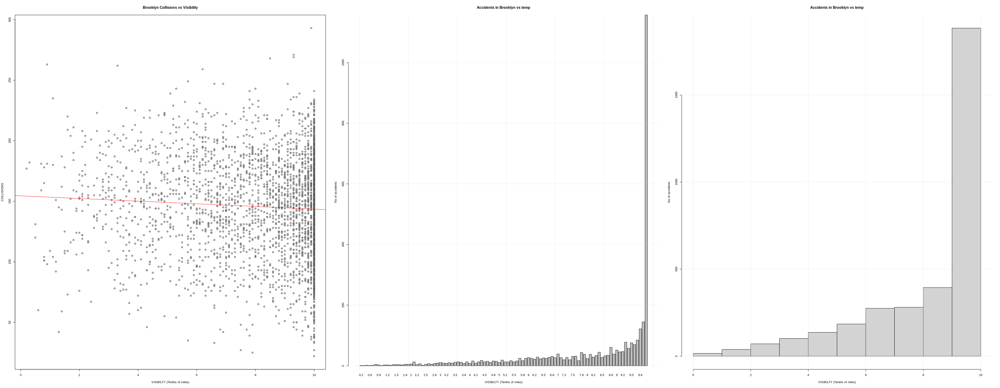

In [56]:
options(repr.plot.width=36, repr.plot.height=14)
par(mfrow=c(1,3))
# brooklyn plots

plot(
  all_brooklyn_data$VISIB, 
  all_brooklyn_data$NUM_COLS, 
  xlab="VISIBILTY (Tenths of miles)", 
  ylab="COLLISIONS", 
  main="Brooklyn Collisions vs Visibility",
)
abline(lm(all_brooklyn_data$NUM_COLS ~ all_brooklyn_data$VISIB), col = "red") 

counts <- table(all_brooklyn_data$VISIB)
barplot(
  counts,
  main = "Accidents in Brooklyn vs temp",
  xlab = "VISIBILTY (Tenths of miles)",
  ylab = "No of accidents",
)
grid()

hist(
  all_brooklyn_data$VISIB,  
  main = "Accidents in Brooklyn vs temp",
  xlab = "VISIBILTY (Tenths of miles)",
  ylab = "No of accidents"
)
grid()

#### Staten Island Visibility

The code below recreates the scatter plot above (complete with the best fit line) as both a bar plot and a histogram.

The barplot and histogra add weight to the idea that visibilty doesn't play a factor in the number of car accidents.

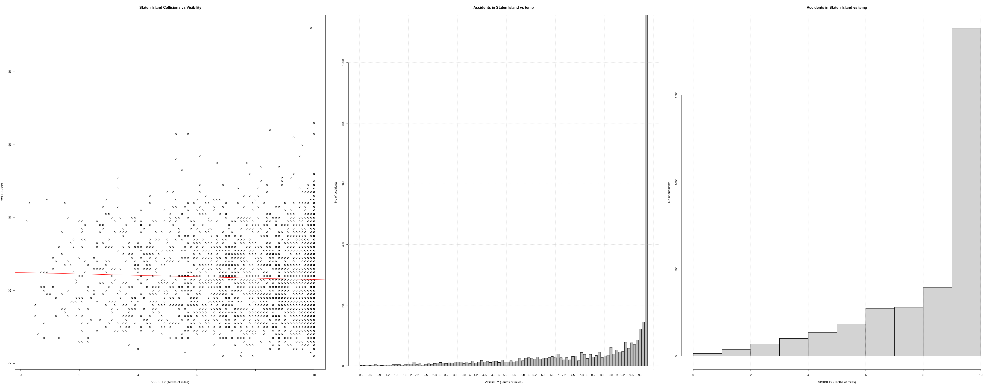

In [57]:
options(repr.plot.width=36, repr.plot.height=14)
par(mfrow=c(1,3))
# staten island plots

plot(
  all_staten_island_data$VISIB, 
  all_staten_island_data$NUM_COLS, 
  xlab="VISIBILTY (Tenths of miles)", 
  ylab="COLLISIONS", 
  main="Staten Island Collisions vs Visibility",
)
abline(lm(all_staten_island_data$NUM_COLS ~ all_staten_island_data$VISIB), col = "red") 

counts <- table(all_staten_island_data$VISIB)
barplot(
  counts,
  main = "Accidents in Staten Island vs temp",
  xlab = "VISIBILTY (Tenths of miles)",
  ylab = "No of accidents",
)
grid()

hist(
  all_staten_island_data$VISIB,  
  main = "Accidents in Staten Island vs temp",
  xlab = "VISIBILTY (Tenths of miles)",
  ylab = "No of accidents"
)
grid()

### Visibilty Conclusions

The graphs suggest that visibility does not increase the number of accidents in any meaningful way.

### Snow depth

Next on the definition of bad weather is snow depth

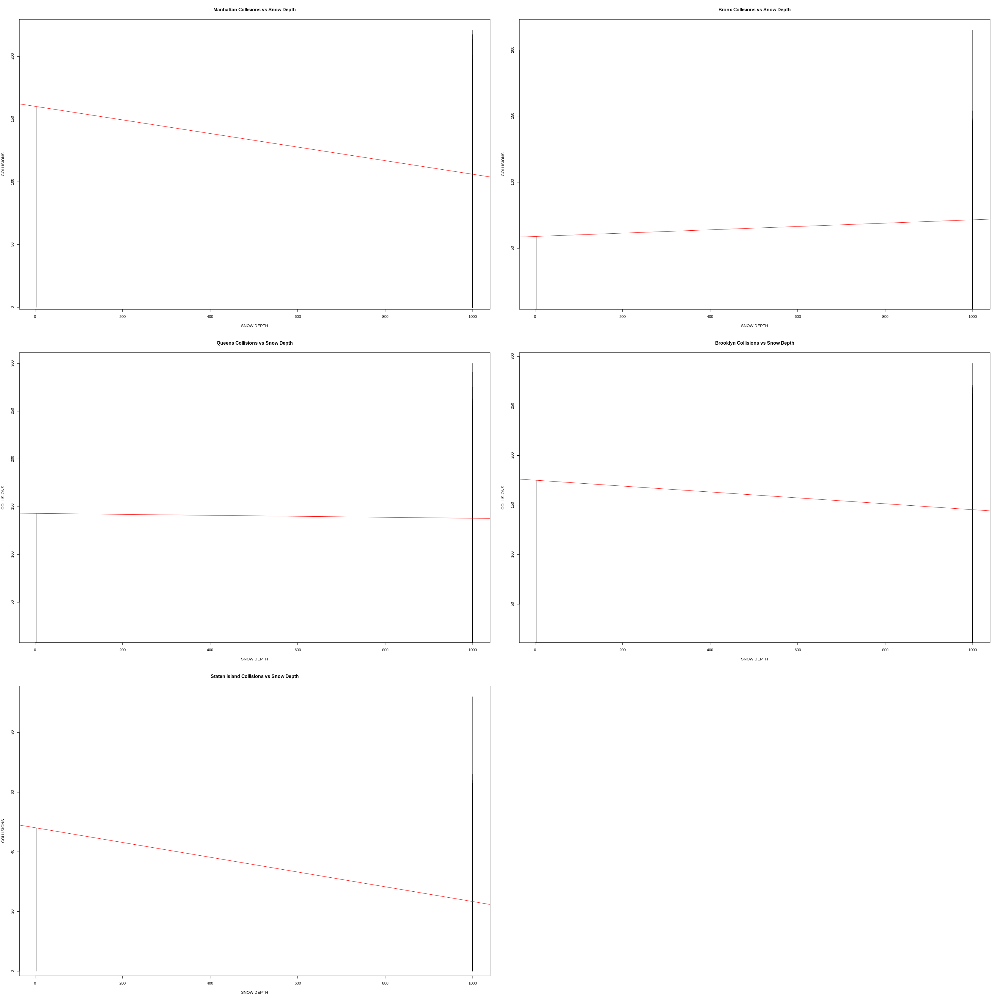

In [58]:
options(repr.plot.width=28, repr.plot.height=28)
par(mfrow=c(3,2))
# manhattan plots

plot(
  all_manhattan_data$SNDP, 
  all_manhattan_data$NUM_COLS, 
  xlab="SNOW DEPTH", 
  ylab="COLLISIONS", 
  main="Manhattan Collisions vs Snow Depth",
  type='h'
)
abline(lm(all_manhattan_data$NUM_COLS ~ all_manhattan_data$SNDP), col = "red") 

# bronx plots

plot(
  all_bronx_data$SNDP, 
  all_bronx_data$NUM_COLS, 
  xlab="SNOW DEPTH", 
  ylab="COLLISIONS", 
  main="Bronx Collisions vs Snow Depth",
  type='h'
)
abline(lm(all_bronx_data$NUM_COLS ~ all_bronx_data$SNDP), col = "red") 

# queens plots

plot(
  all_queens_data$SNDP, 
  all_queens_data$NUM_COLS, 
  xlab="SNOW DEPTH", 
  ylab="COLLISIONS", 
  main="Queens Collisions vs Snow Depth",
  type='h' 
)
abline(lm(all_queens_data$NUM_COLS ~ all_queens_data$SNDP), col = "red") 

# brooklyn plots

plot(
  all_brooklyn_data$SNDP, 
  all_brooklyn_data$NUM_COLS, 
  xlab="SNOW DEPTH", 
  ylab="COLLISIONS", 
  main="Brooklyn Collisions vs Snow Depth",
  type='h'
)
abline(lm(all_brooklyn_data$NUM_COLS ~ all_brooklyn_data$SNDP), col = "red") 

# staten island plots

plot(
  all_staten_island_data$SNDP, 
  all_staten_island_data$NUM_COLS, 
  xlab="SNOW DEPTH", 
  ylab="COLLISIONS", 
  main="Staten Island Collisions vs Snow Depth",
  type='h' 
)
abline(lm(all_staten_island_data$NUM_COLS ~ all_staten_island_data$SNDP), col = "red") 

The above graphs provide no meaningful data.  Looking back at the dataset and using manhattan as an example, the following query was ran

```sql
SELECT DISTINCT(sndp) FROM `uhi-assignment-1.assignment.collated_data` WHERE
NEIGHBORHOOD="MANHATTAN" AND (YEAR != "2021" OR YEAR != "2012" OR YEAR != "2020")
```
And this produces:

|Row|sndp       |
|:-:|:-:        |
|  1|999.9      |
|  2|3.9        |

"999.9" is, according to the dataset documentation, used in place of missing data.
This renders snow depth as not valid.  However, all may not be lost.  The dataset also contains **prcp** which, according to the documentation, is defined as _"tal precipitation (rain and/or melted snow) reported during the day in inches and hundredths"_

Plotting using this data yields the following:

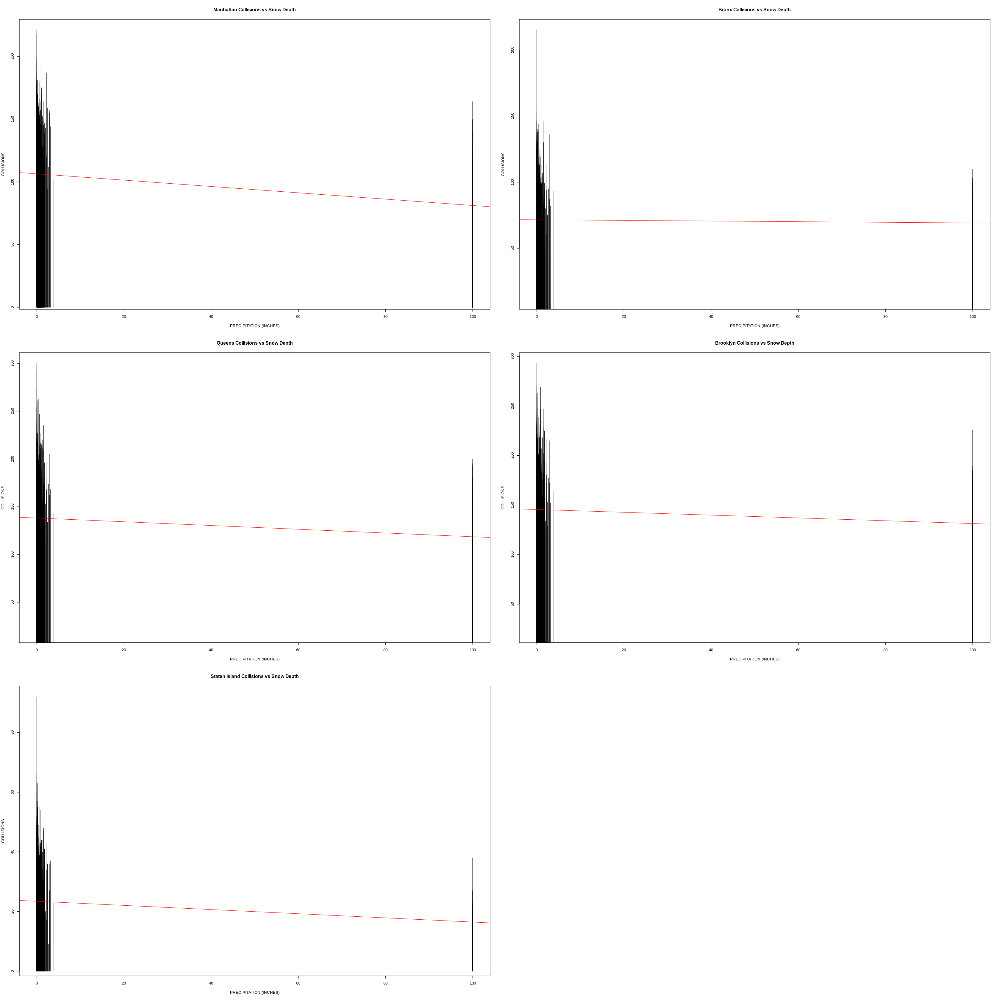

In [59]:
options(repr.plot.width=28, repr.plot.height=28)
par(mfrow=c(3,2))
# manhattan plots

plot(
  all_manhattan_data$PRCP, 
  all_manhattan_data$NUM_COLS, 
  xlab="PRECIPITATION (INCHES)", 
  ylab="COLLISIONS", 
  main="Manhattan Collisions vs Snow Depth",
  type='h'
)
abline(lm(all_manhattan_data$NUM_COLS ~ all_manhattan_data$PRCP), col = "red") 

# bronx plots

plot(
  all_bronx_data$PRCP, 
  all_bronx_data$NUM_COLS, 
  xlab="PRECIPITATION (INCHES)", 
  ylab="COLLISIONS", 
  main="Bronx Collisions vs Snow Depth",
  type='h'
)
abline(lm(all_bronx_data$NUM_COLS ~ all_bronx_data$PRCP), col = "red") 

# queens plots

plot(
  all_queens_data$PRCP, 
  all_queens_data$NUM_COLS, 
  xlab="PRECIPITATION (INCHES)", 
  ylab="COLLISIONS", 
  main="Queens Collisions vs Snow Depth",
  type='h' 
)
abline(lm(all_queens_data$NUM_COLS ~ all_queens_data$PRCP), col = "red") 

# brooklyn plots

plot(
  all_brooklyn_data$PRCP, 
  all_brooklyn_data$NUM_COLS, 
  xlab="PRECIPITATION (INCHES)", 
  ylab="COLLISIONS", 
  main="Brooklyn Collisions vs Snow Depth",
  type='h'
)
abline(lm(all_brooklyn_data$NUM_COLS ~ all_brooklyn_data$PRCP), col = "red") 

# staten island plots

plot(
  all_staten_island_data$PRCP, 
  all_staten_island_data$NUM_COLS, 
  xlab="PRECIPITATION (INCHES)", 
  ylab="COLLISIONS", 
  main="Staten Island Collisions vs Snow Depth",
  type='h' 
)
abline(lm(all_staten_island_data$NUM_COLS ~ all_staten_island_data$PRCP), col = "red") 

The graphs are being distorted by some outlayers.  The values at 100 are actually "99.99" which is used to denote missing data.

Updating the query to remove these values (which will reduce the data points) gives the following:


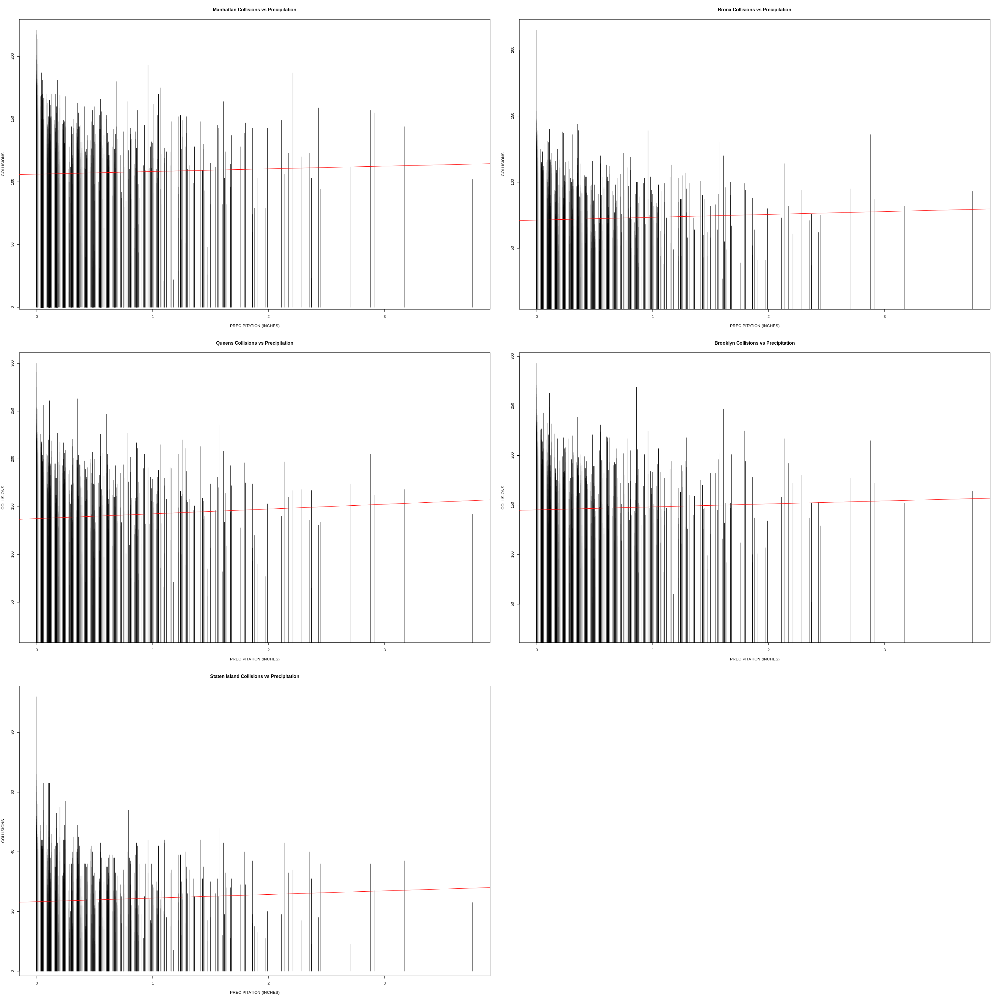

In [60]:
options(repr.plot.width=28, repr.plot.height=28)
par(mfrow=c(3,2))
# queries
prcp_manhattan_query = 'SELECT * FROM file WHERE BOROUGH="MANHATTAN" AND (YEAR != "2012" OR YEAR != "2020" OR YEAR != "2021") AND PRCP != 99.99'
prcp_bronx_query = 'SELECT * FROM file WHERE BOROUGH="BRONX" AND (YEAR != "2012" OR YEAR != "2020" OR YEAR != "2021") AND PRCP != 99.99'
prcp_queens_query = 'SELECT * FROM file WHERE BOROUGH="QUEENS" AND (YEAR != "2012" OR YEAR != "2020" OR YEAR != "2021") AND PRCP != 99.99'
prcp_staten_island_query = 'SELECT * FROM file WHERE BOROUGH="STATEN ISLAND" AND (YEAR != "2012" OR YEAR != "2020" OR YEAR != "2021") AND PRCP != 99.99'
prcp_brooklyn_query = 'SELECT * FROM file WHERE BOROUGH="BROOKLYN" AND (YEAR != "2012" OR YEAR != "2020" OR YEAR != "2021") AND PRCP != 99.99'

# # get the data

all_manhattan_data = read.csv.sql(data_all, prcp_manhattan_query)
all_bronx_data = read.csv.sql(data_all, prcp_bronx_query)
all_queens_data = read.csv.sql(data_all, prcp_queens_query)
all_staten_island_data = read.csv.sql(data_all, prcp_staten_island_query)
all_brooklyn_data = read.csv.sql(data_all, prcp_brooklyn_query)

# manhattan plot
plot(
  all_manhattan_data$PRCP, 
  all_manhattan_data$NUM_COLS, 
  xlab="PRECIPITATION (INCHES)", 
  ylab="COLLISIONS", 
  main="Manhattan Collisions vs Precipitation",
  type='h'
)
abline(lm(all_manhattan_data$NUM_COLS ~ all_manhattan_data$PRCP), col = "red") 

# bronx plots
plot(
  all_bronx_data$PRCP, 
  all_bronx_data$NUM_COLS, 
  xlab="PRECIPITATION (INCHES)", 
  ylab="COLLISIONS", 
  main="Bronx Collisions vs Precipitation",
  type='h'
)
abline(lm(all_bronx_data$NUM_COLS ~ all_bronx_data$PRCP), col = "red") 

# queens plots
plot(
  all_queens_data$PRCP, 
  all_queens_data$NUM_COLS, 
  xlab="PRECIPITATION (INCHES)", 
  ylab="COLLISIONS", 
  main="Queens Collisions vs Precipitation",
  type='h' 
)
abline(lm(all_queens_data$NUM_COLS ~ all_queens_data$PRCP), col = "red") 

# brooklyn plots
plot(
  all_brooklyn_data$PRCP, 
  all_brooklyn_data$NUM_COLS, 
  xlab="PRECIPITATION (INCHES)", 
  ylab="COLLISIONS", 
  main="Brooklyn Collisions vs Precipitation",
  type='h'
)
abline(lm(all_brooklyn_data$NUM_COLS ~ all_brooklyn_data$PRCP), col = "red") 

# staten island plots
plot(
  all_staten_island_data$PRCP, 
  all_staten_island_data$NUM_COLS, 
  xlab="PRECIPITATION (INCHES)", 
  ylab="COLLISIONS", 
  main="Staten Island Collisions vs Precipitation",
  type='h' 
)
abline(lm(all_staten_island_data$NUM_COLS ~ all_staten_island_data$PRCP), col = "red") 

This now looks usable.  The line of best fit now shows an increase - suggesting that as the amount of rain (or melted now) increases, so does the number of accidents.

Looking at each borough may provide some useful insights:

#### Manhattan Precipitation

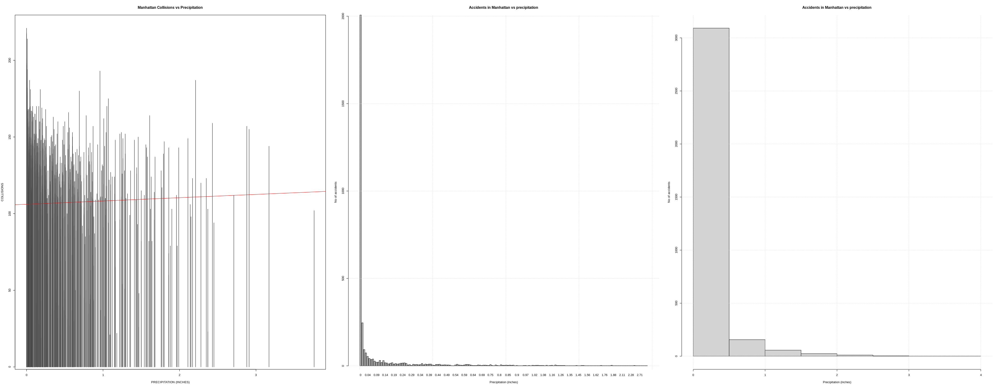

In [61]:
options(repr.plot.width=36, repr.plot.height=14)
par(mfrow=c(1,3))
# staten island plots

# manhattan plot
plot(
  all_manhattan_data$PRCP, 
  all_manhattan_data$NUM_COLS, 
  xlab="PRECIPITATION (INCHES)", 
  ylab="COLLISIONS", 
  main="Manhattan Collisions vs Precipitation",
  type='h'
)
abline(lm(all_manhattan_data$NUM_COLS ~ all_manhattan_data$PRCP), col = "red") 

counts <- table(all_manhattan_data$PRCP)
barplot(
  counts,
  main = "Accidents in Manhattan vs precipitation",
  xlab = "Precipitation (inches)",
  ylab = "No of accidents",
)
grid()

hist(
  all_manhattan_data$PRCP,  
  main = "Accidents in Manhattan vs precipitation",
  xlab = "Precipitation (inches)",
  ylab = "No of accidents"
)
grid()

#### Bronx Precipitation

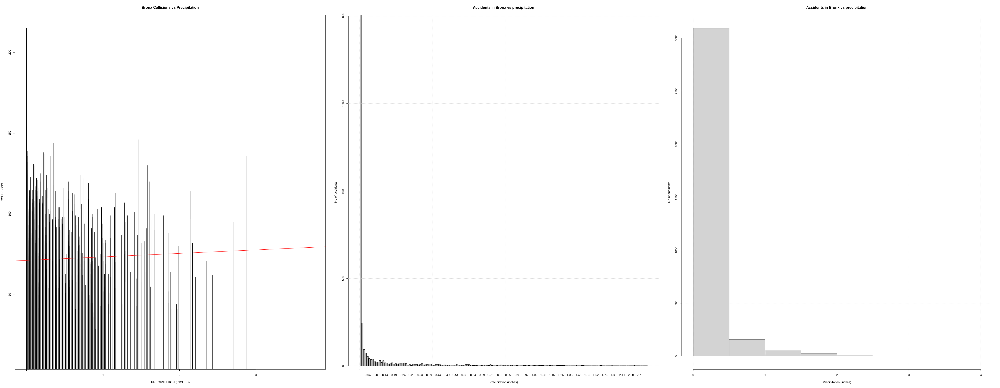

In [66]:
options(repr.plot.width=36, repr.plot.height=14)
par(mfrow=c(1,3))
# staten island plots

# bronx plots
plot(
  all_bronx_data$PRCP, 
  all_bronx_data$NUM_COLS, 
  xlab="PRECIPITATION (INCHES)", 
  ylab="COLLISIONS", 
  main="Bronx Collisions vs Precipitation",
  type='h'
)
abline(lm(all_bronx_data$NUM_COLS ~ all_bronx_data$PRCP), col = "red") 

counts <- table(all_bronx_data$PRCP)
barplot(
  counts,
  main = "Accidents in Bronx vs precipitation",
  xlab = "Precipitation (inches)",
  ylab = "No of accidents",
)
grid()

hist(
  all_bronx_data$PRCP,  
  main = "Accidents in Bronx vs precipitation",
  xlab = "Precipitation (inches)",
  ylab = "No of accidents"
)
grid()

#### Queens Precipitation

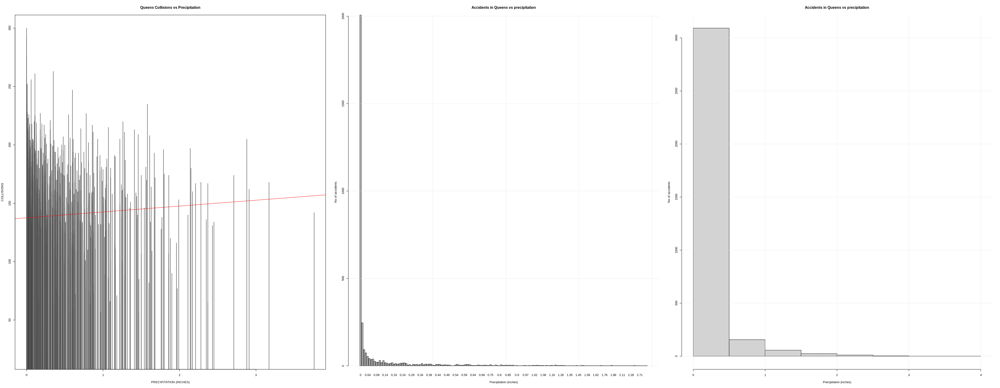

In [67]:
options(repr.plot.width=36, repr.plot.height=14)
par(mfrow=c(1,3))
# staten island plots

# queens plots
plot(
  all_queens_data$PRCP, 
  all_queens_data$NUM_COLS, 
  xlab="PRECIPITATION (INCHES)", 
  ylab="COLLISIONS", 
  main="Queens Collisions vs Precipitation",
  type='h' 
)
abline(lm(all_queens_data$NUM_COLS ~ all_queens_data$PRCP), col = "red") 

counts <- table(all_queens_data$PRCP)
barplot(
  counts,
  main = "Accidents in Queens vs precipitation",
  xlab = "Precipitation (inches)",
  ylab = "No of accidents",
)
grid()

hist(
  all_queens_data$PRCP,  
  main = "Accidents in Queens vs precipitation",
  xlab = "Precipitation (inches)",
  ylab = "No of accidents"
)
grid()

#### Brooklyn Precipitation

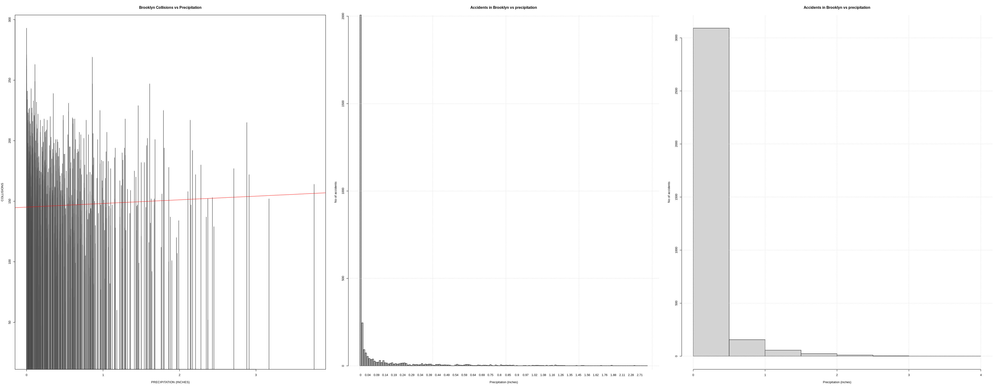

In [68]:
options(repr.plot.width=36, repr.plot.height=14)
par(mfrow=c(1,3))
# staten island plots

# brooklyn plots
plot(
  all_brooklyn_data$PRCP, 
  all_brooklyn_data$NUM_COLS, 
  xlab="PRECIPITATION (INCHES)", 
  ylab="COLLISIONS", 
  main="Brooklyn Collisions vs Precipitation",
  type='h'
)
abline(lm(all_brooklyn_data$NUM_COLS ~ all_brooklyn_data$PRCP), col = "red") 

counts <- table(all_brooklyn_data$PRCP)
barplot(
  counts,
  main = "Accidents in Brooklyn vs precipitation",
  xlab = "Precipitation (inches)",
  ylab = "No of accidents",
)
grid()

hist(
  all_brooklyn_data$PRCP,  
  main = "Accidents in Brooklyn vs precipitation",
  xlab = "Precipitation (inches)",
  ylab = "No of accidents"
)
grid()

#### Staten Island Precipation


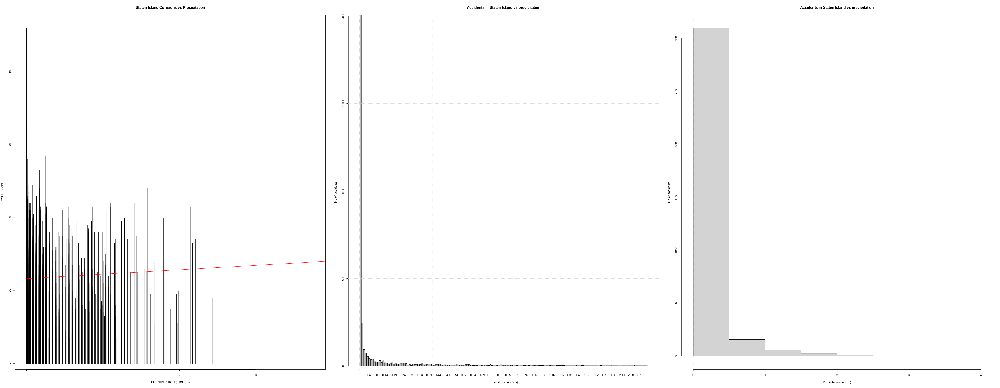

In [69]:
options(repr.plot.width=36, repr.plot.height=14)
par(mfrow=c(1,3))
# staten island plots

# staten island plots
plot(
  all_staten_island_data$PRCP, 
  all_staten_island_data$NUM_COLS, 
  xlab="PRECIPITATION (INCHES)", 
  ylab="COLLISIONS", 
  main="Staten Island Collisions vs Precipitation",
  type='h' 
)
abline(lm(all_staten_island_data$NUM_COLS ~ all_staten_island_data$PRCP), col = "red") 

counts <- table(all_staten_island_data$PRCP)
barplot(
  counts,
  main = "Accidents in Staten Island vs precipitation",
  xlab = "Precipitation (inches)",
  ylab = "No of accidents",
)
grid()

hist(
  all_staten_island_data$PRCP,  
  main = "Accidents in Staten Island vs precipitation",
  xlab = "Precipitation (inches)",
  ylab = "No of accidents"
)
grid()

### Precipitation and Snow Depth Conclusions